In [1]:
#import everything
from allensdk.core.mouse_connectivity_cache import MouseConnectivityCache
import numpy
import umap
import hdbscan
import seaborn
import matplotlib.pyplot as plt
import matplotlib as mpl
from mpl_toolkits.mplot3d import Axes3D
import pandas as pandas
import math
from scipy import stats
from sklearn.decomposition import PCA
from sklearn import preprocessing
from skimage.metrics import structural_similarity as ssim
import plotly
import plotly.graph_objects as go
from scipy.stats import zscore
import sys
sys.path.append("C:/Code/BeierLab")
sys.path.append("C:/Code/BeierLab/EMBEDR/")
%matplotlib notebook

In [2]:
from embedr import EMBEDR

In [3]:
from tifffile import imsave
from tifffile import imread
import tifffile

In [4]:
#define things we need from allensdk
mcc = MouseConnectivityCache(manifest_file='connectivity/mouse_connectivity_manifest.json')
# open up a list of all of the experiments
all_experiments = mcc.get_experiments(dataframe=True)
# grab the StructureTree instance (class?)
structure_tree = mcc.get_structure_tree()
#get the list of ids that correspond to acronyms
id_acronym = structure_tree.get_id_acronym_map()

In [6]:
writebatch = '20211017'

# Set up template

In [7]:
structure_tree.get_structures_by_name(["Ventral tegmental area"])

[{'acronym': 'VTA',
  'graph_id': 1,
  'graph_order': 823,
  'id': 749,
  'name': 'Ventral tegmental area',
  'structure_id_path': [997, 8, 343, 313, 323, 749],
  'structure_set_ids': [112905828,
   691663206,
   687527945,
   10,
   12,
   688152365,
   184527634,
   167587189,
   114512891],
  'rgb_triplet': [255, 144, 255]}]

In [8]:
template, template_info = mcc.get_template_volume()
annot, annot_info = mcc.get_annotation_volume()

In [9]:
annot.shape

(528, 320, 456)

In [10]:
vta_id = 749

In [11]:
vta_xslices,_,_ = numpy.where(annot==vta_id)

In [12]:
vta_xslices

array([315, 315, 315, ..., 354, 354, 354], dtype=int64)

In [13]:
vta_x_min_idx = numpy.min(vta_xslices)
vta_x_max_idx = numpy.max(vta_xslices)

vta_z_length = int(annot.shape[2]/2)
vta_x_min_idx

315

In [10]:
vta_template=template[vta_x_min_idx:vta_x_max_idx,:,:]
vta_template = vta_template[:,:,:vta_z_length]
imsave('vta.template.tif', vta_template, bigtiff=True)

In [21]:
vta_annot=annot[vta_x_min_idx:vta_x_max_idx,:,:]
vta_annot = vta_annot[:,:,:vta_z_length]
imsave('vta.annot.tif', vta_annot, bigtiff=True)

In [182]:
imsave('template.tif', template, bigtiff=True)
imsave('annot.tif', annot, bigtiff=True)

# Read in experiments
From 1-s2.0-S2211124718319703-mmc4.xlsx

In [1]:
#experiments_dict = {'AntCtx':[112596790,157711748,180709230],
#                    'NAcMedS':[168614604,175732001,168615344],
#                    'NAcCore':[175373569,168615344,175373569],
#                    #'NAcLat':[167904966,146045723,170785775],
#                    'NAcLat':[113505468],
#                    'VP':[159650350,138058320,147632458],
#                    'PO':[113554719,146470726,113553300],
#                    'Septum':[100141597,125830911,267810394],
#                    'BNST':[147049515,117312486,127909584],
#                    'EAM':[175072921,175372863,180981417],
#                    'GPe':[159942097,511942270,158373958],
#                    'PVH':[181057754,175106053,180674463],
#                    'LHb':[267494468,147353537,272875838],
#                    'MHb':[156931568,127255962,156979283],
#                    'CeA':[146795148,175072921,127761449],
#                    'LH':[158258062,113313632,113313632],
#                    'ZI':[126190743,113095845,175018829],
#                    'DR':[114155190,128055110,480074702],
#                    'LDT':[158434409,158435826,128002057],
#                    'PBN':[268415561,127469566,147635309],
#                    'DCN':[120493315,268389532,156872043],
#                    'DStr':[160537796,113766038,159941339],
#                    'GPi':[305024724,278501857,265944167]
#              }

In [55]:
del pds_dict_flip

In [14]:
experiments_dict = {#'AntCtx':[112596790,157711748,180709230],
                'Orb':[167902586,287769286,180709230],
                'IL and PL':[263106036,157711748,286313491],
                'NAcMedS':[168614604,170785775,168615344],
                'NAcCore':[175373569,168615344,167904966],
                'VP':[159650350,138058320,147632458],
                'PO':[113554719,146470726,113553300],
                'Septum':[100141597,125830911,267810394],
                'BNST':[147049515,117312486,127909584],
                'EAM':[175072921,175372863,180981417],
                'GPe':[511942270,158373958],
                'PVH':[181057754,175106053,180674463],
                'LHb':[267494468,147353537,272875838],
                'MHb':[268321927,300236056,300843826],
                'CeA':[146795148,265648940,127761449],
                'LH':[158258062,113313632,113313632],
                'ZI':[126190743,113095845,175018829],
                'DR':[114155190,128055110,480074702],
                'LDT':[158434409,158435826,128002057],
                'PBN':[268415561,127469566,147635309],
                'DCN':[120493315,268389532,156872043],
                'DStr':[112458831,148198052,146553266],
                'GPi':[305024724]
              }

In [15]:
regions_keys = list(experiments_dict.keys())
pds_dict = {}

for rgn in regions_keys:
    exps = experiments_dict[rgn]
    pd, pd_info = mcc.get_projection_density(exps[0])
    for i in range(1,(len(exps))):
        pdi, pd_infoi = mcc.get_projection_density(exps[i])
        pd = pd + pdi
    #if rgn=='NAcLat':
    #    pd1, pd_info1 = mcc.get_projection_density(exps[0])
    #    pds_dict[rgn]=(pd1)
    #    continue
    #pd1, pd_info1 = mcc.get_projection_density(exps[0])
    #pd2, pd_info2 = mcc.get_projection_density(exps[1])
    #pd3, pd_info3 = mcc.get_projection_density(exps[2])
    #pds_dict[rgn]=(pd1+pd2+pd3)/3
    pds_dict[rgn]=(pd)/len(exps)

In [16]:
pds_dict_flip = {}
for rgn in regions_keys:
    pds_dict_flip[rgn] = pds_dict[rgn][:,:,::-1]

In [17]:
pds_dict.keys()

dict_keys(['Orb', 'IL and PL', 'NAcMedS', 'NAcCore', 'VP', 'PO', 'Septum', 'BNST', 'EAM', 'GPe', 'PVH', 'LHb', 'MHb', 'CeA', 'LH', 'ZI', 'DR', 'LDT', 'PBN', 'DCN', 'DStr', 'GPi'])

In [18]:
xslice=13

<IPython.core.display.Javascript object>


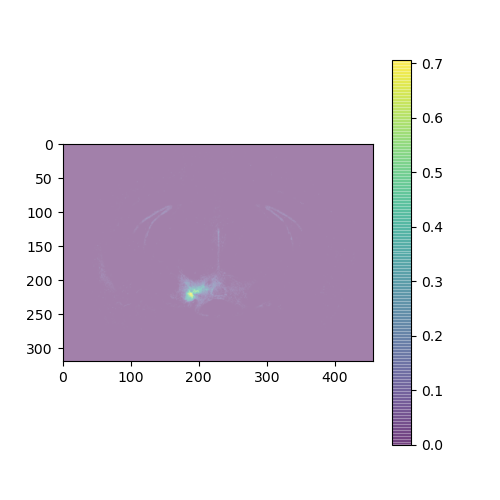

In [21]:
fig,ax = plt.subplots(1,1,figsize=(5,5))
fig.colorbar(ax.imshow(pds_dict_flip['NAcMedS'][vta_x_min+xslice,:,:],alpha=0.5, aspect='equal'))

# Put input values into one matrix

In [20]:
template_brain = tifffile.imread('vta.template.tif')
labeled_brain  = tifffile.imread('vta.annot.tif')

vta_id = 749
vta_x_min = 315
vta_label = (labeled_brain == vta_id).astype(int)
coords = vta_label.nonzero()
coords = numpy.transpose(coords)

In [22]:
numpy.min(coords,axis=0)

array([  0, 188, 173], dtype=int64)

In [23]:
numpy.max(coords,axis=0)

array([ 38, 225, 214], dtype=int64)

In [24]:
vta_label.shape

(39, 320, 228)

In [25]:
vta_xslices,vta_yslices,vta_zslices = numpy.where(labeled_brain==vta_id)

In [26]:
print(numpy.min(coords,axis=0))
print(numpy.max(coords,axis=0))
print(numpy.max(coords,axis=0)-numpy.min(coords,axis=0))

[  0 188 173]
[ 38 225 214]
[38 37 41]


## use all points in vta (3d)

In [18]:
input_ar = numpy.zeros((len(coords),len(regions_keys)))
for i,coord in enumerate(coords):
    for j,rgn in enumerate(regions_keys):
        x,y,z=coord
        input_ar[i,j] = pds_dict[rgn][x+vta_x_min,y,z]

In [19]:
scaled_features = preprocessing.scale(input_ar)
pca_scaled = PCA(n_components=20)
pca_scaled.fit(scaled_features)
pca_scaled.explained_variance_ratio_

array([0.23870537, 0.12471902, 0.0674271 , 0.05543953, 0.05106272,
       0.04784886, 0.04477515, 0.0411881 , 0.03817481, 0.03562888,
       0.03486636, 0.03173272, 0.02975211, 0.02571144, 0.02502892,
       0.02324956, 0.02081786, 0.02033102, 0.01973246, 0.01670391])

<IPython.core.display.Javascript object>


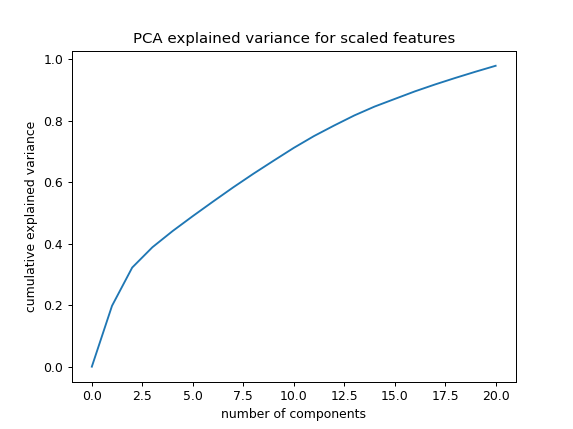

In [109]:
fig,ax = plt.subplots()

plt.plot(numpy.linspace(0,20,21),numpy.cumsum(numpy.append([0],pca_scaled.explained_variance_ratio_)))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');
plt.title('PCA explained variance for scaled features')
plt.savefig('../figures/allen-inputs.pca-explained-variance-scaled.png')
plt.show()

In [21]:
pca_scaled = PCA(n_components=5)
pca_scaled.fit(scaled_features)
pca_scaled_embedding = pca_scaled.transform(scaled_features)

<IPython.core.display.Javascript object>


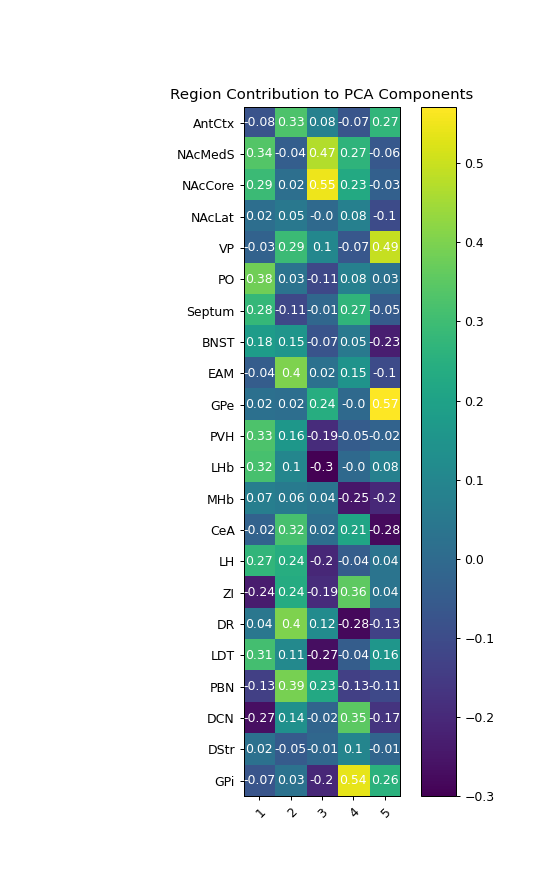

In [111]:
pca_components = pca_scaled.components_
pca_components = numpy.transpose(pca_components)


fig, ax = plt.subplots(figsize=(6,10))
im = ax.imshow(pca_components,cmap='viridis')

ax.set_xticks(numpy.arange(5))
ax.set_yticks(numpy.arange(len(regions_keys)))
# ... and label them with the respective list entries
ax.set_xticklabels([1,2,3,4,5])
ax.set_yticklabels(regions_keys)

# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

# Loop over data dimensions and create text annotations.
for i in range(len(regions_keys)):
    for j in range(5):
        text = ax.text(j, i, pca_components[i, j].round(decimals=2),
                       ha="center", va="center", color="w")

ax.set_title("Region Contribution to PCA Components")
#fig.tight_layout()

# Create colorbar
cbar = ax.figure.colorbar(im, ax=ax)
plt.savefig('../figures/allen-inputs.pca.components.png',facecolor='white', transparent=False)
plt.show()

In [23]:
fig=go.Figure(data=go.Scatter(
    y=pca_scaled_embedding[:, 1],
    x=pca_scaled_embedding[:, 0],
    mode='markers',
    hoverinfo="text"
    ))



fig.update_layout(
    width=800,
    height=800,
    xaxis_title='PCA 1D',
    yaxis_title='PCA 2D',
    title={
        'text': "VTA Inputs - PCA By Cell Type and Outputs",
        'x': 0.5
    },
    xaxis={
        'showline':True,
        'showgrid':False, 
        'ticks':'outside',
        'mirror':True,
        'zeroline':False
    },
    yaxis={
        'showline':True,
        'showgrid':False, 
        'ticks':'outside',
        'mirror':True,
        'zeroline':False
    }
)


In [24]:
fig=go.Figure(data=go.Scatter(
    y=pca_scaled_embedding[:, 2],
    x=pca_scaled_embedding[:, 1],
    mode='markers',
    hoverinfo="text"
    ))



fig.update_layout(
    width=800,
    height=800,
    xaxis_title='PCA 2D',
    yaxis_title='PCA 3D',
    title={
        'text': "VTA Inputs - PCA By Cell Type and Outputs",
        'x': 0.5
    },
    xaxis={
        'showline':True,
        'showgrid':False, 
        'ticks':'outside',
        'mirror':True,
        'zeroline':False
    },
    yaxis={
        'showline':True,
        'showgrid':False, 
        'ticks':'outside',
        'mirror':True,
        'zeroline':False
    }
)

In [106]:
coords.shape

(13677, 3)

In [107]:
pca_scaled_embedding.shape

(629, 5)

<IPython.core.display.Javascript object>


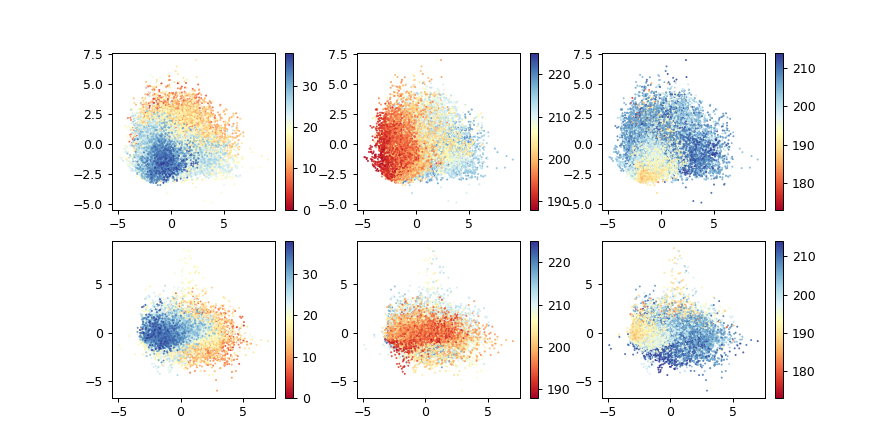

In [112]:
fig,ax = plt.subplots(2,3,figsize=(10,5))

cm = plt.cm.get_cmap('RdYlBu')

for i in [0,1]:
    for j in [0,1,2]:
        sc = ax[i][j].scatter(pca_scaled_embedding[:,i],pca_scaled_embedding[:,i+1],c=coords[:,j],s=0.3,cmap=cm)
        plt.colorbar(sc,ax=ax[i][j])



<IPython.core.display.Javascript object>


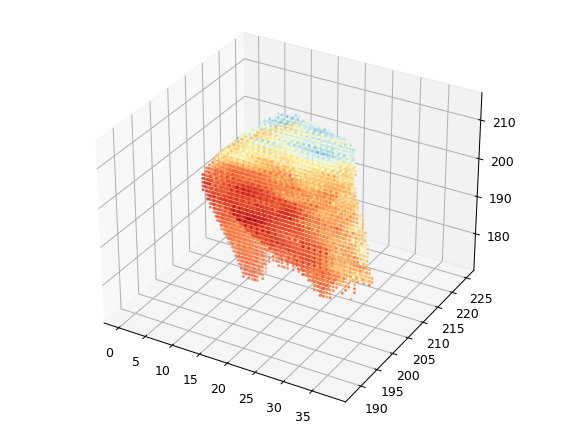

In [113]:
fig = plt.figure()
ax = Axes3D(fig)

ax.scatter(coords[:,0],coords[:,1],coords[:,2],s=2,c=pca_scaled_embedding[:,0],cmap=cm)
plt.show()

<IPython.core.display.Javascript object>


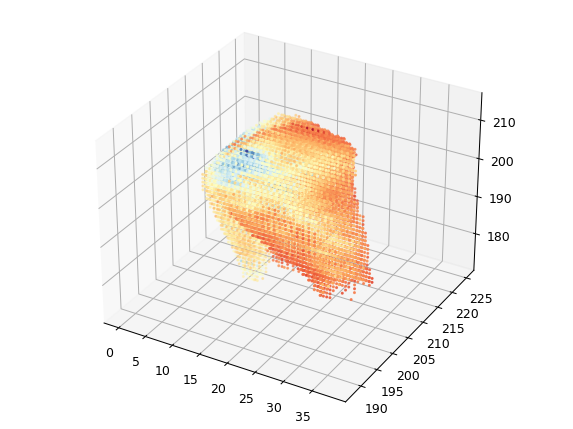

In [114]:
fig = plt.figure()
ax = Axes3D(fig)

ax.scatter(coords[:,0],coords[:,1],coords[:,2],s=2,c=pca_scaled_embedding[:,1],cmap=cm)
plt.show()

<IPython.core.display.Javascript object>


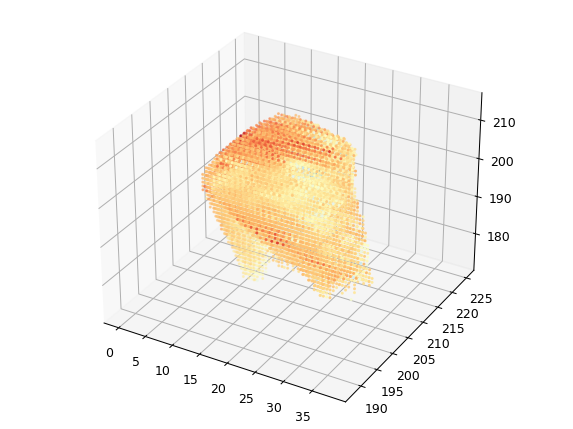

In [115]:
fig = plt.figure()
ax = Axes3D(fig)

ax.scatter(coords[:,0],coords[:,1],coords[:,2],s=2,c=pca_scaled_embedding[:,2],cmap=cm)
plt.show()

<IPython.core.display.Javascript object>


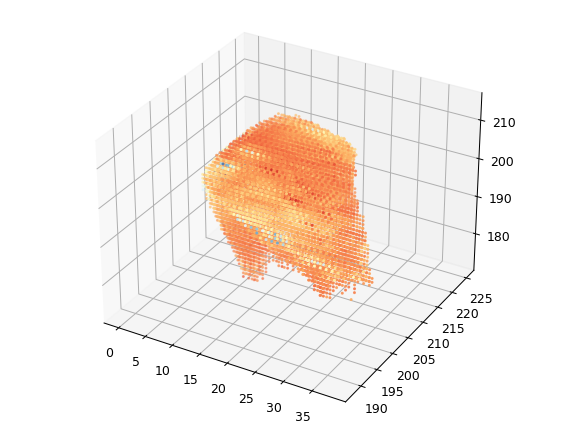

In [116]:
fig = plt.figure()
ax = Axes3D(fig)

ax.scatter(coords[:,0],coords[:,1],coords[:,2],s=2,c=pca_scaled_embedding[:,3],cmap=cm)
plt.show()

In [30]:
numpy.savetxt('../data/vtacoords.csv', coords, delimiter=",")
numpy.savetxt('../data/allen-inputs.pca.csv', pca_scaled_embedding, delimiter=",")

In [31]:
len(coords)

13677

# UMAP of inputs

In [117]:
scaled_features.shape

(13677, 22)

In [118]:
idx = numpy.arange(0,len(coords))
subidx = numpy.random.choice(idx,1000,replace=False)

In [119]:
scaled_features[subidx].shape

(1000, 22)

In [120]:
umap_scaled_embedding=umap.UMAP(n_neighbors=25,min_dist=1,metric='euclidean').fit_transform(scaled_features[subidx])

In [121]:
clusterer=hdbscan.HDBSCAN(min_cluster_size=5)

clusterer.fit(umap_scaled_embedding)

color_palette = seaborn.color_palette('hls', (numpy.max(clusterer.labels_+1)))
cluster_colors = [color_palette[x] if x>= 0
                  else (0.5, 0.5, 0.5)
                  for x in clusterer.labels_]
cluster_member_colors = [seaborn.desaturate(x, p) for x, p in
                        zip(cluster_colors, clusterer.probabilities_)]
umap_cluster_colors_hex=['#%02x%02x%02x' %tuple(int(c*256) for c in l) for l in cluster_member_colors]

fig=go.Figure(data=go.Scatter(
    y=umap_scaled_embedding[:, 1],
    x=umap_scaled_embedding[:, 0],
    mode='markers',
    marker_color=umap_cluster_colors_hex,
    hoverinfo="text"
    ))

fig.update_layout(
    width=800,
    height=800,
    xaxis_title='UMAP 1D',
    yaxis_title='UMAP 2D',
    title={
        'text': "VTA Inputs - UMAP By Cell Type and Outputs",
        'x': 0.5
    },
    xaxis={
        'showline':True,
        'showgrid':False, 
        'ticks':'outside',
        'mirror':True,
        'zeroline':False
    },
    yaxis={
        'showline':True,
        'showgrid':False, 
        'ticks':'outside',
        'mirror':True,
        'zeroline':False
    }
)


In [122]:
biomarker_df = scaled_features[subidx].copy()

In [123]:
biomarker_df[:,2].shape

(1000,)

In [124]:
regions_keys

['AntCtx',
 'NAcMedS',
 'NAcCore',
 'NAcLat',
 'VP',
 'PO',
 'Septum',
 'BNST',
 'EAM',
 'GPe',
 'PVH',
 'LHb',
 'MHb',
 'CeA',
 'LH',
 'ZI',
 'DR',
 'LDT',
 'PBN',
 'DCN',
 'DStr',
 'GPi']

<IPython.core.display.Javascript object>


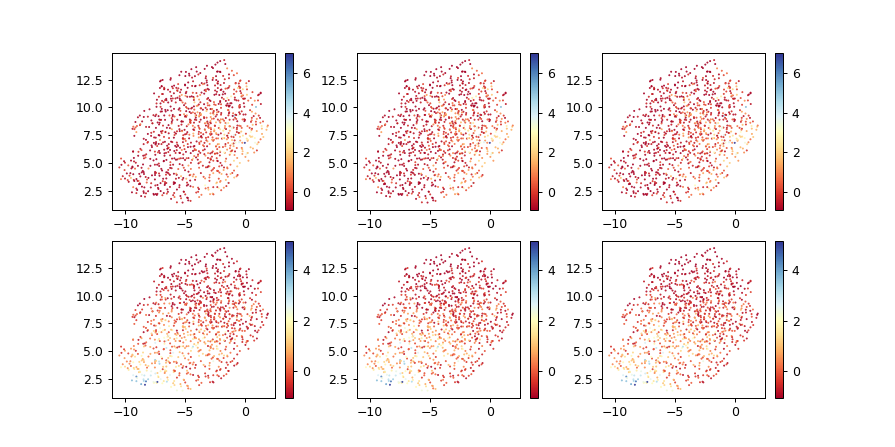

In [127]:
fig,ax = plt.subplots(2,3,figsize=(10,5))

cm = plt.cm.get_cmap('RdYlBu')
region_idx = [1,2,9,13,20,21]
for i in [0,1]:
    for j in [0,1,2]:
        sc = ax[i][j].scatter(umap_scaled_embedding[:,0],umap_scaled_embedding[:,1],c=biomarker_df[:,i],s=0.3,cmap=cm)
        plt.colorbar(sc,ax=ax[i][j])

In [37]:
numpy.savetxt('../data/vtacoords-subsample.csv', coords[subidx], delimiter=",")
numpy.savetxt('../data/allen-inputs.umap.csv', umap_scaled_embedding, delimiter=",")

# Box instead of VTA

In [56]:
print(numpy.min(coords,axis=0))
print(numpy.max(coords,axis=0))

[  0 188 173]
[ 38 225 214]


In [57]:
xmin, ymin, zmin = numpy.min(coords,axis=0)
xmax, ymax, zmax = numpy.max(coords,axis=0)
xeps = 5; yeps = 5; zeps = 5;

In [58]:
xlen = xmax-xmin+2*xeps+1; ylen = ymax-ymin+2*yeps+1; zlen = zmax-zmin+2*zeps+1;

In [59]:
inputbox_ar = numpy.zeros((xlen*ylen*zlen,len(regions_keys)))
box_coords = numpy.zeros((xlen*ylen*zlen,3))

In [60]:
i=0
for x in range(xmin-xeps,xmax+xeps+1):
    for y in range(ymin-yeps,ymax+yeps+1):
        for z in range(zmin-zeps,zmax+zeps+1):
            box_coords[i,:]=numpy.array([x+vta_x_min,y,z],dtype=int)
            i=i+1

In [61]:
for i,coord in enumerate(box_coords):
    for j,rgn in enumerate(regions_keys):
        x,y,z=coord.astype(int)
        inputbox_ar[i,j] = pds_dict[rgn][x,y,z]

In [62]:
scaled_features = preprocessing.scale(inputbox_ar)
pca_scaled = PCA(n_components=20)
pca_scaled.fit(scaled_features)
pca_scaled.explained_variance_ratio_

array([0.30480339, 0.11183816, 0.08406172, 0.06687378, 0.05576558,
       0.04969831, 0.0409991 , 0.0367348 , 0.03200552, 0.02894471,
       0.0263083 , 0.0249009 , 0.02181073, 0.01949511, 0.01729982,
       0.01547733, 0.01471049, 0.01312524, 0.01168058, 0.01013649])

In [259]:
pca_scaled = PCA(n_components=5)
pca_scaled.fit(scaled_features)
pca_scaled_embedding = pca_scaled.transform(scaled_features)

<IPython.core.display.Javascript object>


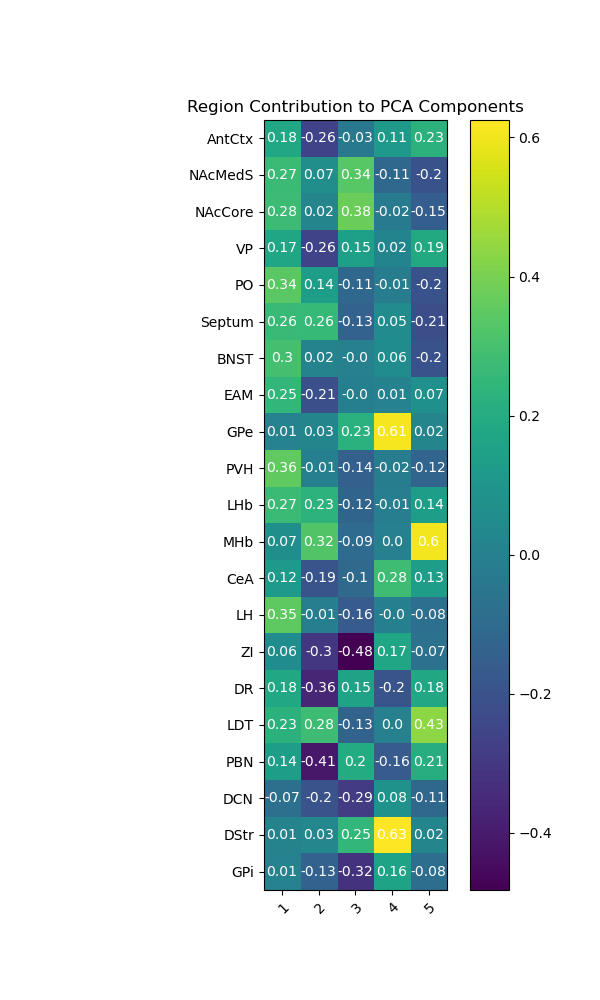

In [260]:
pca_components = pca_scaled.components_
pca_components = numpy.transpose(pca_components)


fig, ax = plt.subplots(figsize=(6,10))
im = ax.imshow(pca_components,cmap='viridis')

ax.set_xticks(numpy.arange(5))
ax.set_yticks(numpy.arange(len(regions_keys)))
# ... and label them with the respective list entries
ax.set_xticklabels([1,2,3,4,5])
ax.set_yticklabels(regions_keys)

# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

# Loop over data dimensions and create text annotations.
for i in range(len(regions_keys)):
    for j in range(5):
        text = ax.text(j, i, pca_components[i, j].round(decimals=2),
                       ha="center", va="center", color="w")

ax.set_title("Region Contribution to PCA Components")
#fig.tight_layout()

# Create colorbar
cbar = ax.figure.colorbar(im, ax=ax)
plt.savefig('../figures/allen-inputs.pca-box.components.'+str(writebatch)+'.png',facecolor='white', transparent=False)
plt.show()

In [261]:
numpy.savetxt('../data/vtaboxcoords.csv', box_coords, delimiter=",")
numpy.savetxt('../data/allen-inputs.pca-box.'+str(writebatch)+'.csv', pca_scaled_embedding, delimiter=",")

In [262]:
scaled_features.shape

(122304, 21)

In [263]:
idx = numpy.arange(0,len(coords))
subidx = numpy.random.choice(idx,1000,replace=False)

In [264]:
scaled_features[subidx].shape

(1000, 21)

In [265]:
umap_scaled_embedding=umap.UMAP(n_neighbors=25,min_dist=1,metric='euclidean').fit_transform(scaled_features[subidx])

In [639]:
clusterer=hdbscan.HDBSCAN(min_cluster_size=5)

clusterer.fit(umap_scaled_embedding)

color_palette = seaborn.color_palette('hls', (numpy.max(clusterer.labels_+1)))
cluster_colors = [color_palette[x] if x>= 0
                  else (0.5, 0.5, 0.5)
                  for x in clusterer.labels_]
cluster_member_colors = [seaborn.desaturate(x, p) for x, p in
                        zip(cluster_colors, clusterer.probabilities_)]
umap_cluster_colors_hex=['#%02x%02x%02x' %tuple(int(c*256) for c in l) for l in cluster_member_colors]

fig=go.Figure(data=go.Scatter(
    y=umap_scaled_embedding[:, 1],
    x=umap_scaled_embedding[:, 0],
    mode='markers',
    marker_color=umap_cluster_colors_hex,
    hoverinfo="text"
    ))

fig.update_layout(
    width=800,
    height=800,
    xaxis_title='UMAP 1D',
    yaxis_title='UMAP 2D',
    title={
        'text': "VTA Inputs - UMAP By Cell Type and Outputs",
        'x': 0.5
    },
    xaxis={
        'showline':True,
        'showgrid':False, 
        'ticks':'outside',
        'mirror':True,
        'zeroline':False
    },
    yaxis={
        'showline':True,
        'showgrid':False, 
        'ticks':'outside',
        'mirror':True,
        'zeroline':False
    }
)


In [657]:
regions_keys=numpy.array(regions_keys)

array(['AntCtx', 'NAcMedS', 'NAcCore', 'NAcLat', 'VP', 'PO', 'Septum',
       'BNST', 'EAM', 'GPe', 'PVH', 'LHb', 'MHb', 'CeA', 'LH', 'ZI', 'DR',
       'LDT', 'PBN', 'DCN', 'DStr', 'GPi'], dtype='<U7')

<IPython.core.display.Javascript object>


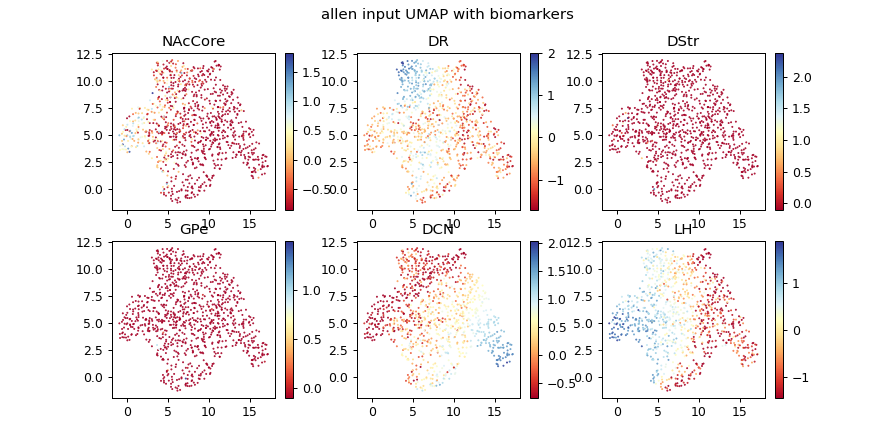

In [677]:
roi = numpy.array(['NAcCore','DR','DStr','GPe','DCN','LH'])
biomarker_df = numpy.log(scaled_features[subidx].copy()+1)

fig,ax = plt.subplots(2,3,figsize=(10,5))

cm = plt.cm.get_cmap('RdYlBu')
region_idx = [1,2,9,13,20,21]
idx = 0
for i in [0,1]:
    for j in [0,1,2]:
        r = numpy.argwhere(regions_keys==roi[idx])
        sc = ax[i][j].scatter(umap_scaled_embedding[:,0],umap_scaled_embedding[:,1],c=biomarker_df[:,r],s=0.3,cmap=cm)
        plt.colorbar(sc,ax=ax[i][j])
        ax[i][j].set_title(roi[idx])
        idx=idx+1
fig.suptitle('allen input UMAP with biomarkers')
plt.savefig('../figures/allen-inputs-box.umap.biomarkers.png')

## use a 2d slice from vta

In [27]:
xs = numpy.unique(coords[:,0])
xcount = numpy.zeros((len(xs),1))
for i,x in enumerate(xs):
    count = 0
    for coord in coords:
        if coord[0] == x:
            count = count + 1
    xcount[i]=count

In [28]:
xmax = numpy.argmax(xcount)
xslice = xs[xmax]
xcoords = coords[coords[:,0] == xslice]
xslice

13

In [29]:
xcoords.shape

(629, 3)

In [30]:
numpy.max(xcoords,axis=0)

array([ 13, 225, 211], dtype=int64)

In [31]:
input_xslice_ar = numpy.zeros((len(xcoords),len(regions_keys)))
i=0
for coord in xcoords:
    for j,rgn in enumerate(regions_keys):
        x,y,z=coord
        input_xslice_ar[i,j] = pds_dict[rgn][x+vta_x_min,y,-z]
    i = i+1

In [32]:
input_xslice_ar.shape

(629, 22)

<IPython.core.display.Javascript object>


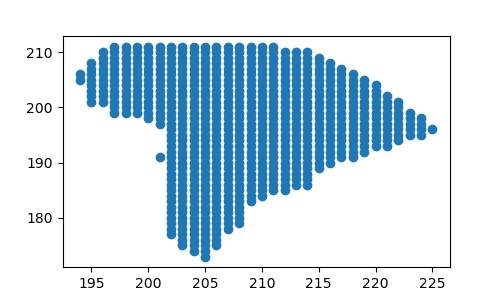

In [33]:
fig,ax = plt.subplots(1,1,figsize=(5,3))

sc = ax.scatter(xcoords[:,1],xcoords[:,2],)

In [34]:
zlstretch = (2.12-1.4/1.2)

In [35]:
xmin, ymin, zmin = numpy.min(xcoords,axis=0)
xmax, ymax, zmax = numpy.max(xcoords,axis=0)
xeps = 0; yeps = 5; zleps = 5+int((zmax-zmin)*zlstretch); zreps = 5;

In [36]:
xlen = xmax-xmin+2*xeps+1; ylen = ymax-ymin+2*yeps+1; zlen = zmax-zmin+zleps+zreps+1;

In [37]:
# if symmetric z
zeps = zleps = zreps = 5; zlen = zmax-zmin+2*zeps+1;

In [38]:
inputbox_ar = numpy.zeros((xlen*ylen*zlen,len(regions_keys)))
box_coords = numpy.zeros((xlen*ylen*zlen,3))

In [39]:
xlen*ylen*zlen

2058

In [40]:
box_coords

array([[0., 0., 0.],
       [0., 0., 0.],
       [0., 0., 0.],
       ...,
       [0., 0., 0.],
       [0., 0., 0.],
       [0., 0., 0.]])

In [41]:
i=0
for x in range(xmin-xeps,xmax+xeps+1):
    for y in range(ymin-yeps,ymax+yeps+1):
        for z in range(zmin-zleps,zmax+zreps+1):
            box_coords[i,:]=numpy.array([x+vta_x_min,y,z],dtype=int)
            i=i+1

In [42]:
for i,coord in enumerate(box_coords):
    for j,rgn in enumerate(regions_keys):
        x,y,z=coord.astype(int)
        inputbox_ar[i,j] = pds_dict_flip[rgn][x,y,z]

<IPython.core.display.Javascript object>


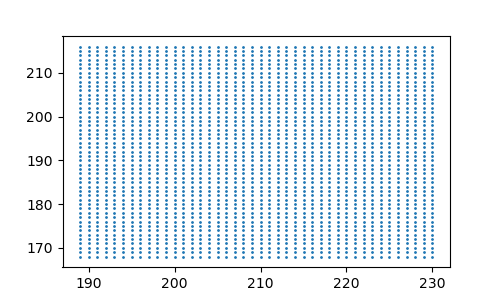

In [43]:
fig,ax = plt.subplots(1,1,figsize=(5,3))

sc = ax.scatter(box_coords[:,1],box_coords[:,2],s=1)

In [44]:
box_coords.shape

(2058, 3)

In [45]:
scaled_features = preprocessing.scale(inputbox_ar)
pca_scaled = PCA(n_components=20)
pca_scaled.fit(scaled_features)
pca_scaled.explained_variance_ratio_

array([0.28102717, 0.17018666, 0.15878004, 0.08409132, 0.06996574,
       0.04041761, 0.02500738, 0.02233983, 0.02162321, 0.02018262,
       0.01588697, 0.01310091, 0.01218459, 0.01048018, 0.01004877,
       0.0090012 , 0.00765009, 0.00703147, 0.00658132, 0.00622114])

In [36]:
numpy.savetxt('../data/allen.xslice.scaledfeatures.'+writebatch+'.csv', scaled_features, delimiter=",")
pandas.DataFrame(numpy.array(regions_keys)).to_csv('../data/allen.regions.'+writebatch+'.csv')


In [46]:
pca_scaled = PCA(n_components=5)
pca_scaled.fit(scaled_features)
pca_scaled_embedding = pca_scaled.transform(scaled_features)

In [47]:
rabies_regions = numpy.array(['Cortex', 'NAcMed', 'NAcLat', 'NAcCore', 'DStr', 'VP', 'PO',
       'Septum', 'BNST', 'EAM', 'EP', 'Gpe', 'PVH', 'LHb', 'MHb', 'CeA',
       'LH', 'ZI', 'DR', 'LDT', 'PBN', 'DCN'], dtype=object)

In [48]:
allen_regions = numpy.array(regions_keys)

In [49]:
allen_region_order = []

for r in rabies_regions:
    if r in allen_regions:
        allen_region_order.append(numpy.where(allen_regions == r)[0][0])
    elif r == 'Gpe':
        allen_region_order.append(numpy.where(allen_regions == "GPe")[0][0])
    elif r == 'EP':
        allen_region_order.append(numpy.where(allen_regions == "GPi")[0][0])
    elif r == 'NAcMed':
        allen_region_order.append(numpy.where(allen_regions == "NAcMedS")[0][0])
    elif r == 'Cortex':
        allen_region_order.append(numpy.where(allen_regions == "Orb")[0][0])
        allen_region_order.append(numpy.where(allen_regions == "IL and PL")[0][0])
    else:
        print('none:' + r)

none:NAcLat


In [50]:
for i in range(len(allen_region_order)):
    if i not in allen_region_order:
        print(allen_regions[i])

In [51]:
pca_components = pca_scaled.components_
pca_components = numpy.transpose(pca_components)

In [52]:
idx = allen_region_order
rearrange = pca_components[idx,:]
regions = [allen_regions[i] for i in allen_region_order]

In [53]:
idx

[0, 1, 2, 3, 20, 4, 5, 6, 7, 8, 21, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]

<IPython.core.display.Javascript object>


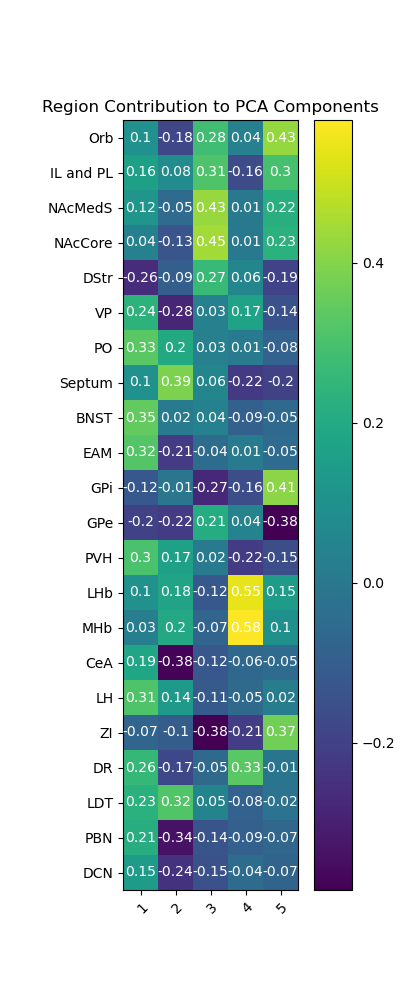

In [97]:
fig, ax = plt.subplots(figsize=(4,10))
im = ax.imshow(rearrange,cmap='viridis')

ax.set_xticks(numpy.arange(5))
ax.set_yticks(numpy.arange(len(allen_regions)))
# ... and label them with the respective list entries
ax.set_xticklabels([1,2,3,4,5])
ax.set_yticklabels(regions)

# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

# Loop over data dimensions and create text annotations.
for i in range(len(regions_keys)):
    for j in range(5):
        text = ax.text(j, i, rearrange[i, j].round(decimals=2),
                       ha="center", va="center", color="w")

ax.set_title("Region Contribution to PCA Components")
#fig.tight_layout()

# Create colorbar
cbar = ax.figure.colorbar(im, ax=ax)
plt.savefig('../figures/allen-inputs.pca-xbox.components.'+writebatch+'.png',facecolor='white', transparent=False)
plt.savefig('../figures/allen-inputs.pca-xbox.components.'+writebatch+'.svg',facecolor='white', transparent=False)
plt.show()

In [285]:
numpy.savetxt('../data/vtaxboxcoords.'+writebatch+'.csv', box_coords, delimiter=",")
numpy.savetxt('../data/allen-inputs.pca-xbox.'+writebatch+'.csv', pca_scaled_embedding, delimiter=",")
numpy.savetxt('../data/vtaxcoords.'+writebatch+'.csv', xcoords, delimiter=",")

In [54]:
box_coords

array([[328., 189., 168.],
       [328., 189., 169.],
       [328., 189., 170.],
       ...,
       [328., 230., 214.],
       [328., 230., 215.],
       [328., 230., 216.]])

In [55]:
masked_template_brain = numpy.ma.masked_where(labeled_brain==749,template_brain)

In [56]:
vta_pca_slice = numpy.zeros((5,)+template_brain[xslice,:,:].shape)
#vta_pca_slice[:,:,:] = numpy.nan
for pca in range(0,5):
    print(pca)
    for i,coord in enumerate(box_coords):
        x,y,z = coord.astype(int)
        vta_pca_slice[pca,y,z]=pca_scaled_embedding[i,pca]
        vta_pca_slice[pca,y,z]

0
1
2
3
4


In [57]:
masked_labeled_brain = numpy.ma.masked_where(labeled_brain==749,labeled_brain)

In [58]:
y1 = -(0-253)*0.025+2
y2 = -(316-253)*0.025+2
z1 = numpy.abs(0-225)*0.025
z2 = numpy.abs(225-225)*0.025
ext = [z1,z2,y1,y2]

In [59]:
print(ext)

[5.625, 0.0, 8.325, 0.4249999999999998]


<IPython.core.display.Javascript object>


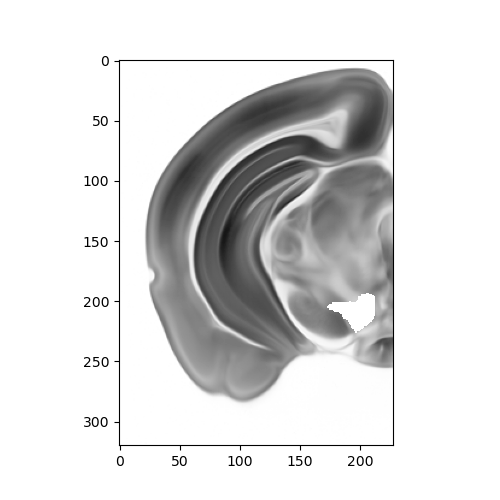

In [60]:
fig,ax = plt.subplots(1,1,figsize=(5,5))
vta_pca_slice[0,:,:][vta_pca_slice[0,:,:] == 0.0] = numpy.nan
ax.imshow(masked_template_brain[xslice,:,:], cmap='binary', aspect='equal', vmin=masked_template_brain.min(), vmax=masked_template_brain.max(),alpha=1)

<IPython.core.display.Javascript object>


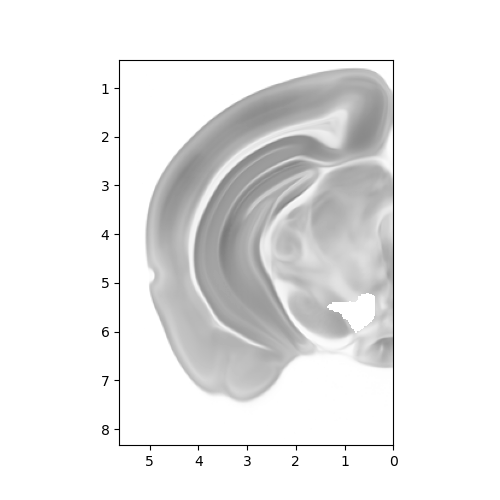

In [46]:
fig,ax = plt.subplots(1,1,figsize=(5,5))
vta_pca_slice[0,:,:][vta_pca_slice[0,:,:] == 0.0] = numpy.nan
ax.imshow(masked_template_brain[xslice,:,:], cmap='binary', aspect='equal', vmin=template.min(), vmax=template.max(),alpha=1,extent=ext)
plt.savefig("../figures/vtatemplate.png")

In [61]:
yuborder = 50
ydborder = 30
zlborder = 60
zrborder = 14

In [62]:
yu = ymin-yuborder
yd = ymax+ydborder
zl = zmin-zlborder
zr = zmax+zrborder

In [63]:
yu = ymin
yd = ymax
zl = zmin
zr = zmax

In [64]:
print(yu)
print(yd)
print(zl)
print(zr)

194
225
173
211


In [75]:
y1 = -(yu-253)*0.025+3.3
y2 = -(yd-253)*0.025+3.3
z1 = numpy.abs(zl-225)*0.025
z2 = numpy.abs(zr-225)*0.025

In [77]:
ext = [z1,z2,y1,y2]

In [78]:
print(ext)

[1.3, 0.35000000000000003, 4.775, 4.0]


<IPython.core.display.Javascript object>


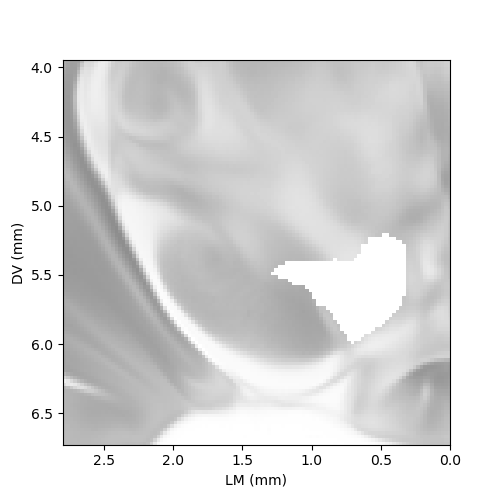

In [402]:
fig,ax = plt.subplots(1,1,figsize=(5,5))
vta_pca_slice[0,:,:][vta_pca_slice[0,:,:] == 0.0] = numpy.nan
ax.imshow(masked_template_brain[xslice,(yu):(yd),(zl):(zr)], cmap='binary', aspect='equal', vmin=template.min(), vmax=template.max(),alpha=1,extent=ext)
ax.set_xlabel('LM (mm)')
ax.set_ylabel('DV (mm)')
plt.savefig("../figures/vtatemplate-cropped.png")

<IPython.core.display.Javascript object>


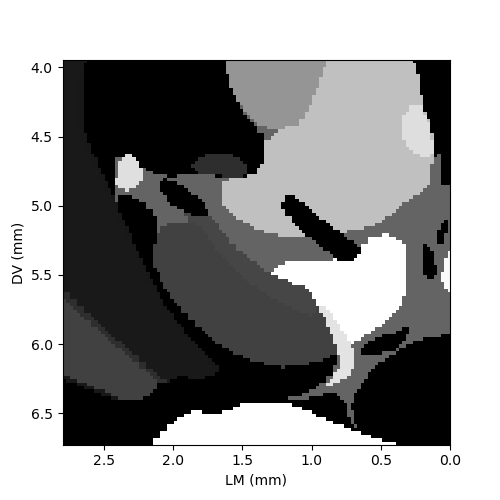

In [403]:
fig,ax = plt.subplots(1,1,figsize=(5,5))
vta_pca_slice[0,:,:][vta_pca_slice[0,:,:] == 0.0] = numpy.nan
ax.imshow(masked_labeled_brain[xslice,(yu):(yd),(zl):(zr)], cmap='binary', aspect='equal', vmin=template.min(), vmax=template.max(),alpha=1,extent=ext)
ax.set_xlabel('LM (mm)')
ax.set_ylabel('DV (mm)')
plt.savefig("../figures/vtaannot-cropped.png")

In [68]:
alpha_pc1 = numpy.zeros((41,48))
for i in range (41):
    for j in range(48):
        if vta_pca_slice[0,yu+i,zl+j] > 4:
            alpha_pc1[i,j]=0.5

In [69]:
import matplotlib as mpl

In [70]:
print(vta_pca_slice[0,(yu):(yd),(zl):(zr)].min())
print(vta_pca_slice[0,(yu):(yd),(zl):(zr)].max())

-4.69094844807876
5.181377708133808


In [71]:
cm1 = mpl.cm.get_cmap('winter',256)
cm1._init()
for i in range(cm1.N+3):
    if i < 2*(cm1.N+3)/3:
        cm1._lut[i,-1]=0.1
    else:
        cm1._lut[i,-1]=0.5

<IPython.core.display.Javascript object>


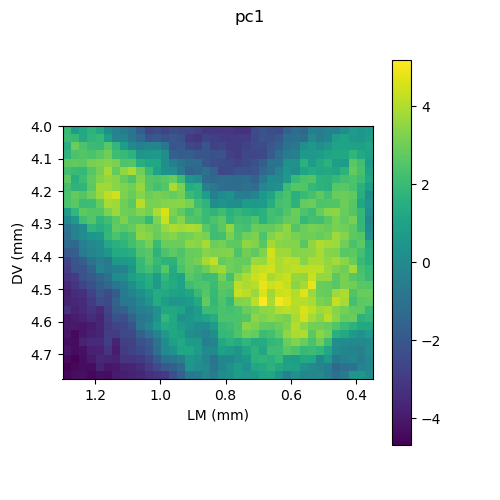

In [85]:
fig,ax = plt.subplots(1,1,figsize=(5,5))
vta_pca_slice[0,:,:][vta_pca_slice[0,:,:] == 0.0] = numpy.nan
#ax.imshow(masked_template_brain[xslice,(yu):(yd),(zl):(zr)], cmap='binary', aspect='equal', vmin=template.min(), vmax=template.max(),alpha=1,extent=ext)
fig.colorbar(ax.imshow(vta_pca_slice[0,(yu):(yd),(zl):(zr)], aspect='equal',alpha=1,extent=ext))
ax.set_xlabel('LM (mm)')
ax.set_ylabel('DV (mm)')
fig.suptitle('pc1')
plt.savefig("../figures/vta-allen-pc1."+writebatch+".png")
plt.savefig("../figures/vta-allen-pc1."+writebatch+".svg")


<IPython.core.display.Javascript object>


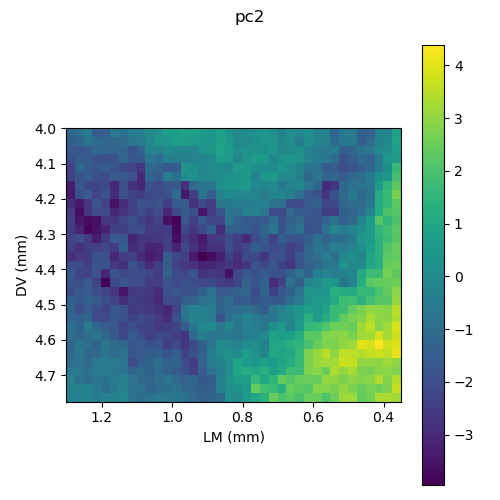

In [86]:
fig,ax = plt.subplots(1,1,figsize=(5,5))
vta_pca_slice[1,:,:][vta_pca_slice[1,:,:] == 0.0] = numpy.nan
#ax.imshow(masked_template_brain[xslice,(yu):(yd),(zl):(zr)], cmap='binary', aspect='equal', vmin=masked_template_brain.min(), vmax=masked_template_brain.max(),alpha=1,extent=ext)
fig.colorbar(ax.imshow(vta_pca_slice[1,(yu):(yd),(zl):(zr)], aspect='equal',extent=ext))
ax.set_xlabel('LM (mm)')
ax.set_ylabel('DV (mm)')
fig.suptitle('pc2')
plt.tight_layout()
plt.savefig("../figures/vta-allen-pc2."+writebatch+".png")
plt.savefig("../figures/vta-allen-pc2."+writebatch+".svg")

<IPython.core.display.Javascript object>


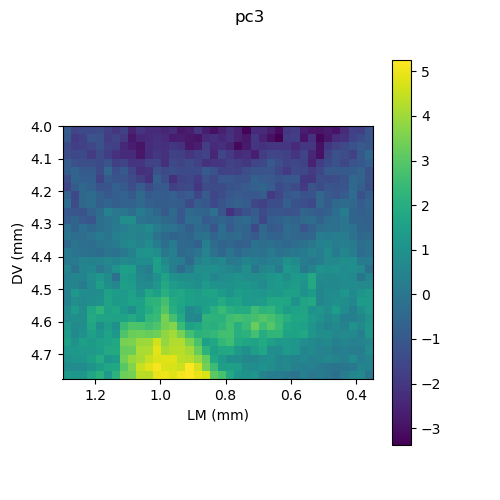

In [87]:
fig,ax = plt.subplots(1,1,figsize=(5,5))
vta_pca_slice[2,:,:][vta_pca_slice[2,:,:] == 0.0] = numpy.nan
#ax.imshow(masked_template_brain[xslice,(yu):(yd),(zl):(zr)], cmap='binary', aspect='equal', vmin=template.min(), vmax=template.max(),alpha=1,extent=ext)
fig.colorbar(ax.imshow(vta_pca_slice[2,(yu):(yd),(zl):(zr)], aspect='equal',extent=ext))
ax.set_xlabel('LM (mm)')
ax.set_ylabel('DV (mm)')
fig.suptitle('pc3')
plt.savefig("../figures/vta-allen-pc3."+writebatch+".png")
plt.savefig("../figures/vta-allen-pc3."+writebatch+".svg")

<IPython.core.display.Javascript object>


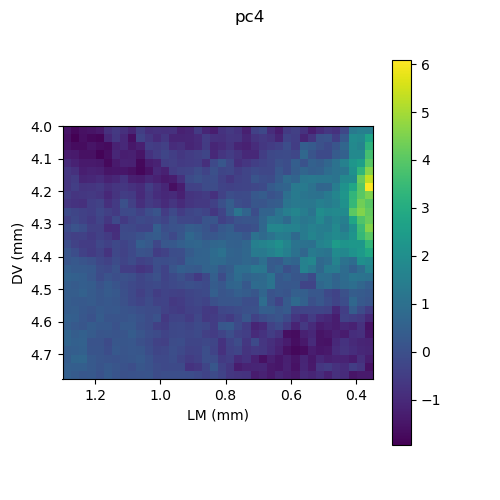

In [88]:
fig,ax = plt.subplots(1,1,figsize=(5,5))
vta_pca_slice[3,:,:][vta_pca_slice[3,:,:] == 0.0] = numpy.nan
#ax.imshow(masked_template_brain[xslice,(yu):(yd),(zl):(zr)], cmap='binary', aspect='equal', vmin=template.min(), vmax=template.max(),alpha=1,extent=ext)
fig.colorbar(ax.imshow(vta_pca_slice[3,(yu):(yd),(zl):(zr)], aspect='equal',alpha=1,extent=ext))
ax.set_xlabel('LM (mm)')
ax.set_ylabel('DV (mm)')
fig.suptitle('pc4')
plt.savefig("../figures/vta-allen-pc4."+writebatch+".png")
plt.savefig("../figures/vta-allen-pc4."+writebatch+".svg")

<IPython.core.display.Javascript object>


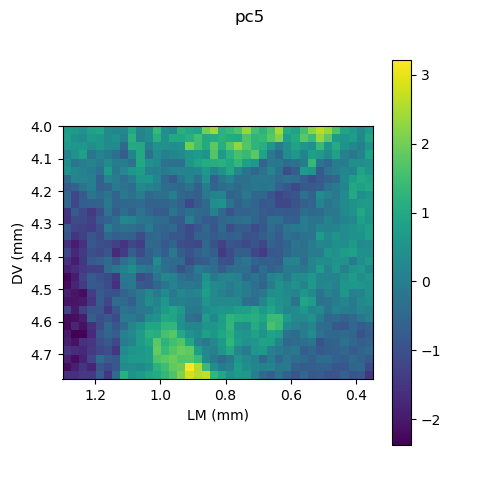

In [89]:
fig,ax = plt.subplots(1,1,figsize=(5,5))
vta_pca_slice[4,:,:][vta_pca_slice[4,:,:] == 0.0] = numpy.nan
#ax.imshow(masked_template_brain[xslice,(yu):(yd),(zl):(zr)], cmap='binary', aspect='equal', vmin=template.min(), vmax=template.max(),alpha=1,extent=ext)
fig.colorbar(ax.imshow(vta_pca_slice[4,(yu):(yd),(zl):(zr)], aspect='equal',alpha=1,extent=ext))
ax.set_xlabel('LM (mm)')
ax.set_ylabel('DV (mm)')
fig.suptitle('pc5')
plt.savefig("../figures/vta-allen-pc5."+writebatch+".png")
plt.savefig("../figures/vta-allen-pc5."+writebatch+".svg")

In [558]:
threshold1 = 1/5
threshold2 = 4/5
v0 = 0.7
v1 = 0.1
v2 = 0.7


cm1 = mpl.cm.get_cmap('Reds',256)
cm1._init()
for i in range(cm1.N+3):
    if i < threshold1*(cm1.N+3):
        cm1._lut[i,-1]=v0
    elif i < threshold2*(cm1.N+3):
        cm1._lut[i,-1]=v1
    else:
        cm1._lut[i,-1]=v2
        
cm2 = mpl.cm.get_cmap('Blues',256)
cm2._init()
for i in range(cm2.N+3):
    if i < threshold1*(cm2.N+3):
        cm2._lut[i,-1]=v0
    elif i < threshold2*(cm2.N+3):
        cm2._lut[i,-1]=v1
    else:
        cm2._lut[i,-1]=v2
        
cm3 = mpl.cm.get_cmap('Greens',256)
cm3._init()
for i in range(cm3.N+3):
    if i < threshold1*(cm3.N+3):
        cm3._lut[i,-1]=v0
    elif i < threshold2*(cm3.N+3):
        cm3._lut[i,-1]=v1
    else:
        cm3._lut[i,-1]=v2

In [436]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

<IPython.core.display.Javascript object>


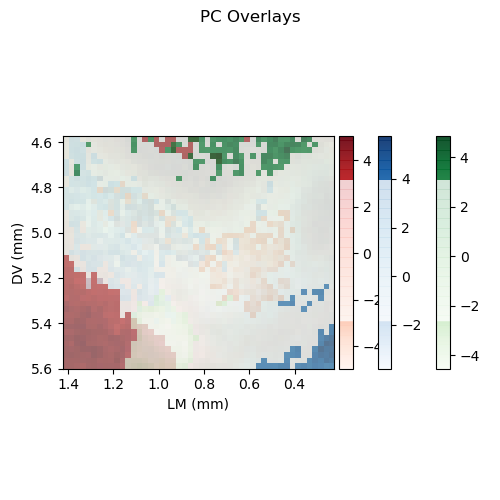

Text(0.5, 0.98, 'PC Overlays')

In [559]:
fig,ax = plt.subplots(1,1,figsize=(5,5))
divider = make_axes_locatable(ax)
cax1 = divider.append_axes("right", size="5%", pad=0.05)
cax2 = divider.append_axes("right", size="5%", pad=0.25)
cax3 = divider.append_axes("right", size="5%", pad=0.45)
vta_pca_slice[0,:,:][vta_pca_slice[0,:,:] == 0.0] = numpy.nan
fig.colorbar(ax.imshow(vta_pca_slice[0,(yu):(yd),(zl):(zr)], aspect='equal',extent=ext,cmap=cm1),cax=cax1)
fig.colorbar(ax.imshow(vta_pca_slice[1,(yu):(yd),(zl):(zr)], aspect='equal',extent=ext,cmap=cm2),cax=cax2)
fig.colorbar(ax.imshow(vta_pca_slice[2,(yu):(yd),(zl):(zr)], aspect='equal',extent=ext,cmap=cm3),cax=cax3)
ax.set_xlabel('LM (mm)')
ax.set_ylabel('DV (mm)')
fig.suptitle('PC Overlays')
#plt.tight_layout()
#plt.savefig("../figures/vta-allen-pc1-3."+writebatch+".png")
#plt.savefig("../figures/vta-allen-pc1-3."+writebatch+".svg")

In [303]:
regions_keys

['AntCtx',
 'NAcMedS',
 'NAcCore',
 'VP',
 'PO',
 'Septum',
 'BNST',
 'EAM',
 'GPe',
 'PVH',
 'LHb',
 'MHb',
 'CeA',
 'LH',
 'ZI',
 'DR',
 'LDT',
 'PBN',
 'DCN',
 'DStr',
 'GPi']

In [195]:
print(yu)
print(yd)
print(zl)
print(zr)

144
255
113
225


In [196]:
ext

[2.8000000000000003, 0.0, 6.725, 3.95]

In [98]:
print(box_coords.min(axis=0))
print(box_coords.max(axis=0))

[328. 189. 168.]
[328. 230. 216.]


In [304]:
ymin = 189
ymax = 230
zmin = 168
zmax = 216

In [305]:
regions_keys

['AntCtx',
 'NAcMedS',
 'NAcCore',
 'VP',
 'PO',
 'Septum',
 'BNST',
 'EAM',
 'GPe',
 'PVH',
 'LHb',
 'MHb',
 'CeA',
 'LH',
 'ZI',
 'DR',
 'LDT',
 'PBN',
 'DCN',
 'DStr',
 'GPi']

In [81]:
vta_rgn_slice = numpy.zeros((len(regions_keys),)+template_brain[xslice,:,:].shape)
#vta_pca_slice[:,:,:] = numpy.nan
for i,rgn in enumerate(regions_keys):
    vta_rgn_slice[i,:,:][vta_rgn_slice[i,:,:] == 0.0] = numpy.nan
    rgn_idx = regions_keys.index(rgn)
    for j,coord in enumerate(box_coords):
        x,y,z = coord.astype(int)
        vta_rgn_slice[i,y,z]=0
        vta_rgn_slice[i,y,z]=inputbox_ar[j,rgn_idx]

In [82]:
vta_rgn_slice.shape

(22, 320, 228)

In [89]:
rgn_ssim = numpy.zeros((len(regions_keys),len(regions_keys)))
for i,rgn1 in enumerate(regions_keys):
    for j,rgn2 in enumerate(regions_keys):
        img1 = vta_rgn_slice[i,ymin:ymax,zmin:zmax]
        img2 = vta_rgn_slice[j,ymin:ymax,zmin:zmax]
        rgn_ssim[i,j] = ssim(img1,img2)

<IPython.core.display.Javascript object>


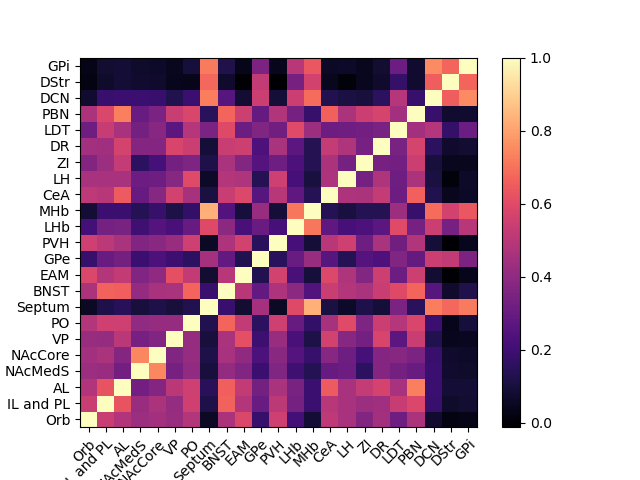

In [70]:
rgn_ssim_df = pandas.DataFrame(rgn_ssim,index=regions_keys,columns=regions_keys)

fig,ax =plt.subplots()

plt.pcolor(rgn_ssim_df,cmap='magma')
plt.yticks(numpy.arange(0.5, len(rgn_ssim_df.index), 1), rgn_ssim_df.index)
plt.xticks(numpy.arange(0.5, len(rgn_ssim_df.columns), 1), rgn_ssim_df.columns)
# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")
plt.colorbar()
plt.show()

<IPython.core.display.Javascript object>


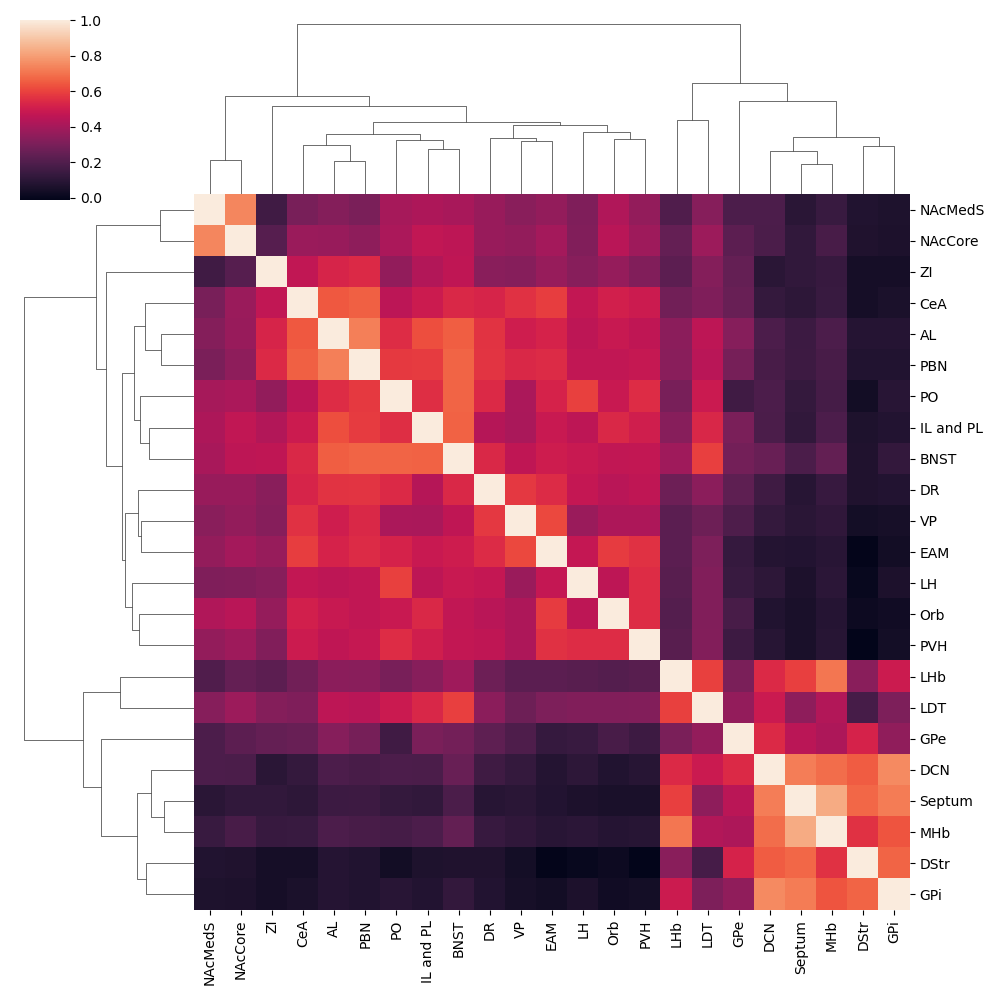

In [71]:
seaborn.clustermap(rgn_ssim_df)
plt.savefig("../figures/vta-allen-similarity."+writebatch+".png")
plt.savefig("../figures/vta-allen-similarity."+writebatch+".svg")

In [72]:
regions_keys

['Orb',
 'IL and PL',
 'AL',
 'NAcMedS',
 'NAcCore',
 'VP',
 'PO',
 'Septum',
 'BNST',
 'EAM',
 'GPe',
 'PVH',
 'LHb',
 'MHb',
 'CeA',
 'LH',
 'ZI',
 'DR',
 'LDT',
 'PBN',
 'DCN',
 'DStr',
 'GPi']

In [91]:
rgns = [
    'NAcMedS','NAcCore',
    'ZI',
    'PVH','LH',
    'DR','VP','EAM',
    'CeA','PBN','PO','BNST',
    'LHb','LDT','GPe','DCN','Septum','MHb','DStr','GPi',
    'Orb','IL and PL'
]

#rgns = [
#    'NAcMedS','NAcCore',
#    'Orb','IL and PL'
#]

rgn_idxs = numpy.zeros(len(rgns),dtype=int)
for i,rgn in enumerate(rgns):
    rgn_idxs[i] = regions_keys.index(rgn)

In [95]:
regions_keys

['Orb',
 'IL and PL',
 'NAcMedS',
 'NAcCore',
 'VP',
 'PO',
 'Septum',
 'BNST',
 'EAM',
 'GPe',
 'PVH',
 'LHb',
 'MHb',
 'CeA',
 'LH',
 'ZI',
 'DR',
 'LDT',
 'PBN',
 'DCN',
 'DStr',
 'GPi']

In [79]:
lat_regions = ['Orb','NAcMedS','NAcCore','DStr','GPe','GPi']

lat_rgn_idxs = numpy.zeros(len(lat_regions),dtype=int)
for i,rgn in enumerate(lat_regions):
    lat_rgn_idxs[i] = regions_keys.index(rgn)

In [83]:
lat_rgn_slice = numpy.zeros((vta_rgn_slice[0,:,:].shape))
for idx in lat_rgn_idxs:
    lat_rgn_slice = lat_rgn_slice + vta_rgn_slice[idx]
lat_rgn_slice = lat_rgn_slice / len(lat_rgn_idxs)

<IPython.core.display.Javascript object>


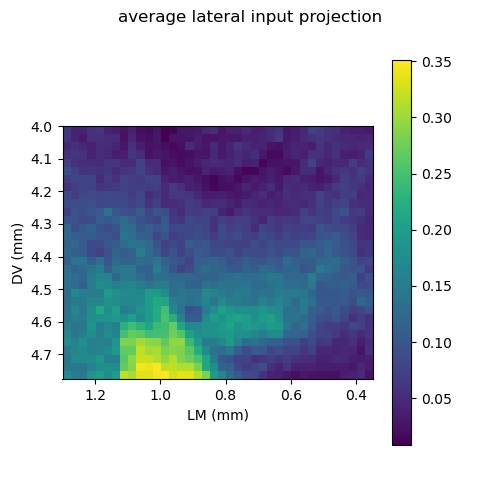

In [84]:
fig,ax = plt.subplots(1,1,figsize=(5,5))
#ax.imshow(masked_template_brain[xslice,(yu):(yd),(zl):(zr)], cmap='binary', aspect='equal', vmin=template.min(), vmax=template.max(),alpha=1,extent=ext)
fig.colorbar(ax.imshow(lat_rgn_slice[(yu):(yd),(zl):(zr)], aspect='equal',alpha=1,extent=ext))
ax.set_xlabel('LM (mm)')
ax.set_ylabel('DV (mm)')
fig.suptitle("average lateral input projection")
plt.savefig("../figures/vta-allen-lat-average."+writebatch+".png")
plt.savefig("../figures/vta-allen-lat-average."+writebatch+".svg")

<IPython.core.display.Javascript object>


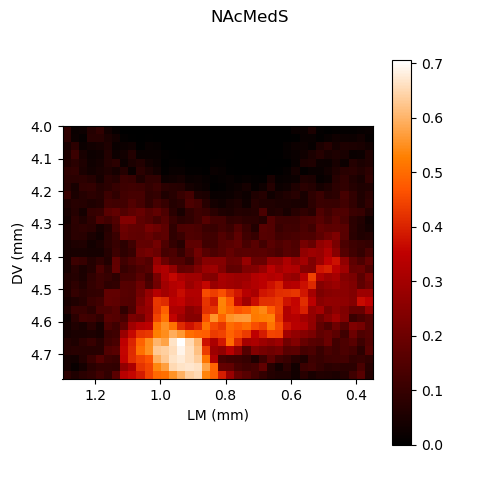

<IPython.core.display.Javascript object>


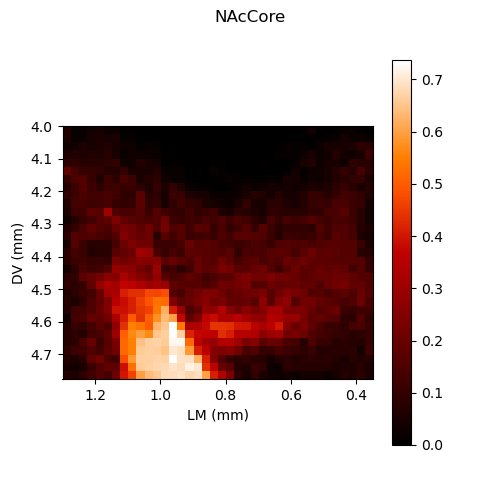

<IPython.core.display.Javascript object>


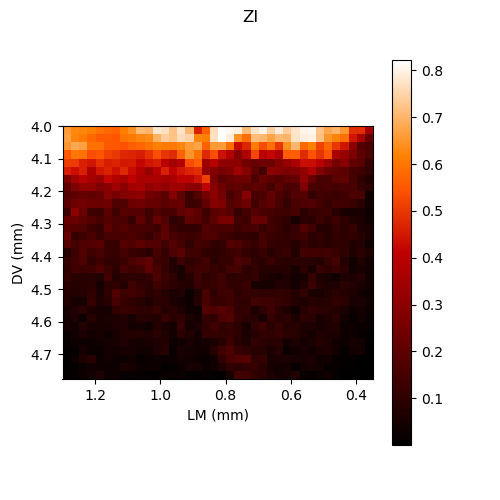

<IPython.core.display.Javascript object>


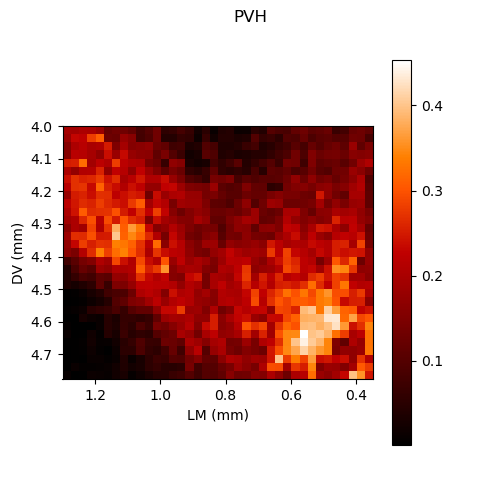

<IPython.core.display.Javascript object>


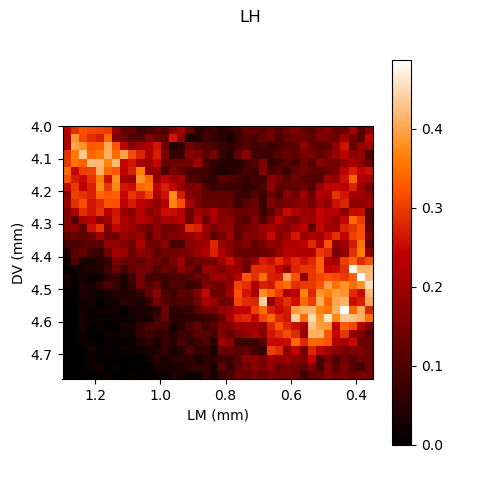

<IPython.core.display.Javascript object>


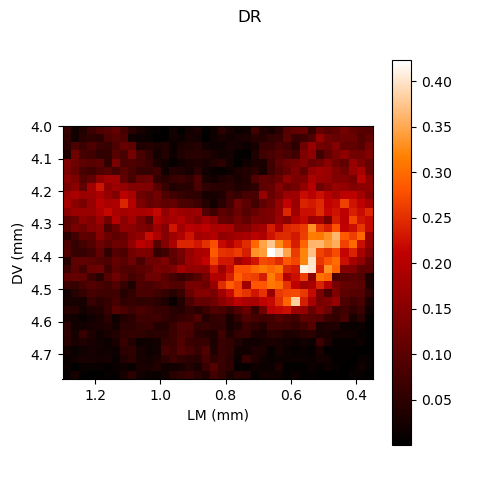

<IPython.core.display.Javascript object>


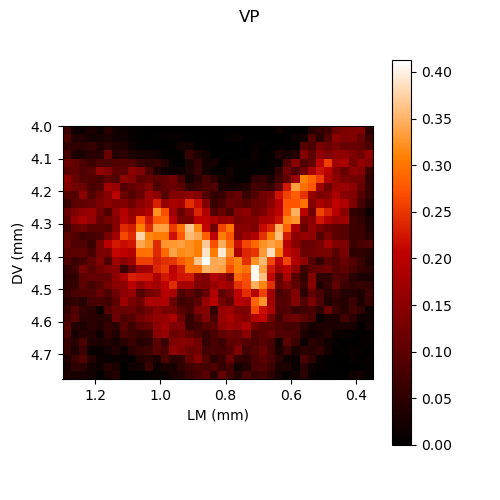

<IPython.core.display.Javascript object>


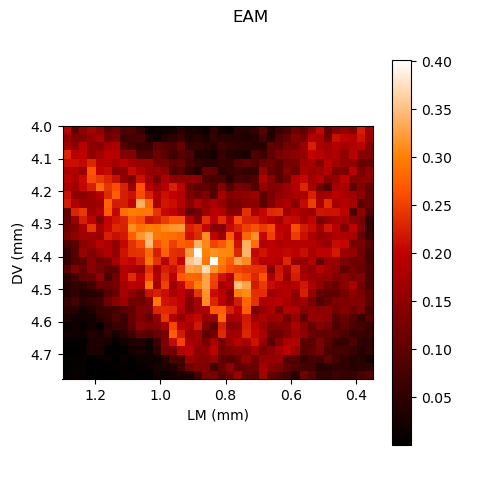

<IPython.core.display.Javascript object>


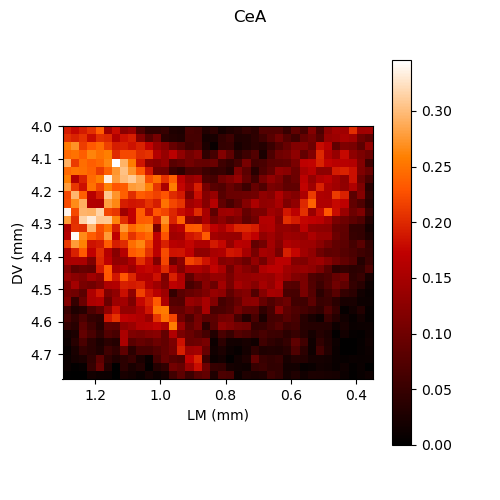

<IPython.core.display.Javascript object>


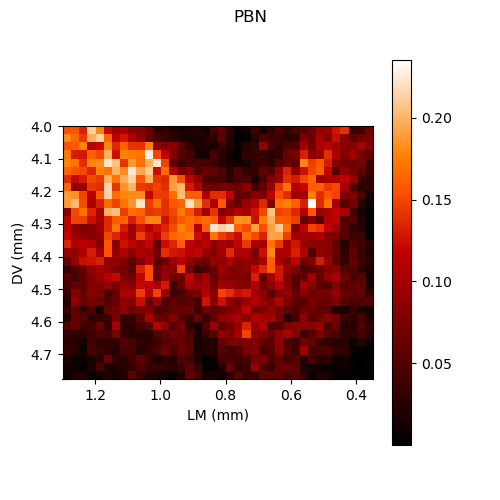

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



<IPython.core.display.Javascript object>


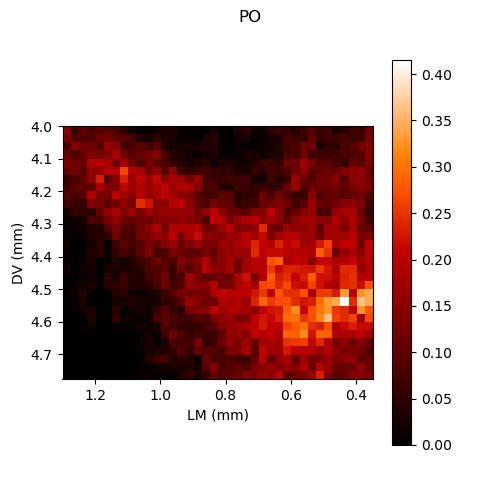

<IPython.core.display.Javascript object>


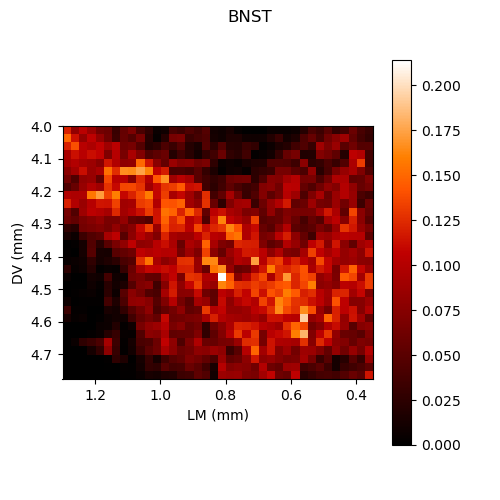

<IPython.core.display.Javascript object>


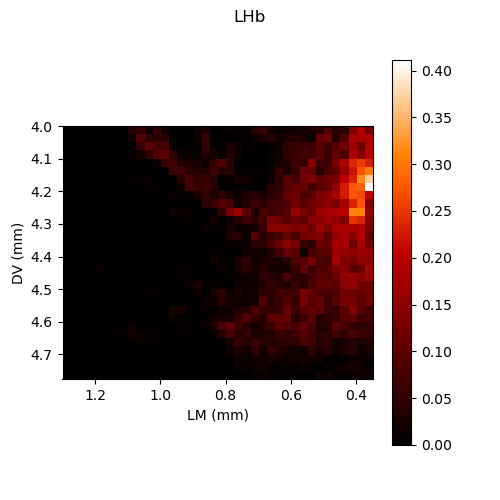

<IPython.core.display.Javascript object>


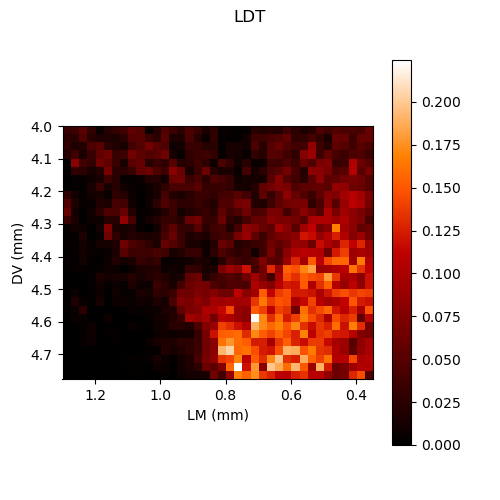

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [92]:
for rgn_no in range(len(rgns)):
    rgn_idx = rgn_idxs[rgn_no]
    fig,ax = plt.subplots(1,1,figsize=(5,5))
    #ax.imshow(masked_template_brain[xslice,(yu):(yd),(zl):(zr)], cmap='binary', aspect='equal', vmin=template.min(), vmax=template.max(),alpha=1,extent=ext)
    fig.colorbar(ax.imshow(vta_rgn_slice[rgn_idx,(yu):(yd),(zl):(zr)], aspect='equal',alpha=1,extent=ext,cmap='gist_heat'))
    ax.set_xlabel('LM (mm)')
    ax.set_ylabel('DV (mm)')
    fig.suptitle(rgns[rgn_no])
    plt.savefig("../figures/vta-allen-"+rgns[rgn_no]+"."+writebatch+".png")
    plt.savefig("../figures/vta-allen-"+rgns[rgn_no]+"."+writebatch+".svg")

In [172]:
print(ymin)
print(ymax)
print(zmin)
print(zmax)

189
230
168
216


In [561]:
ygroups = numpy.array([ymin, ymin + (ymax-ymin) / 3, ymin + 2* (ymax-ymin)/3 , ymax],dtype=int)
zgroups = numpy.array([zmin, zmin + (zmax-zmin) / 3, zmin + 2* (zmax-zmin)/3 , zmax],dtype=int)

In [562]:
boxes = numpy.zeros((len(regions_keys),9))
box_labels = numpy.empty(9,dtype=object)

In [563]:
for i in range(9):
    ygroup = i//3
    yg_min = ygroups[ygroup]
    yg_max = ygroups[ygroup+1]
    
    zgroup = i%3
    zg_min = zgroups[zgroup]
    zg_max = zgroups[zgroup+1]
    
    box_labels[i] = "LM "+str(zgroup)+", DV " + str(ygroup)
    
    for y in range(yg_min,yg_max):
        for z in range(zg_min,zg_max):
            for r in range(len(regions_keys)):
                boxes[r,i] = boxes[r,i] + vta_rgn_slice[r,y,z]

In [564]:
"LM "+str(zgroup)+", DV " + str(ygroup)

'LM 2, DV 2'

In [565]:
boxes_frac = (boxes / boxes.sum(axis=1)[:,None])

In [566]:
box_labels

array(['LM 0, DV 0', 'LM 1, DV 0', 'LM 2, DV 0', 'LM 0, DV 1',
       'LM 1, DV 1', 'LM 2, DV 1', 'LM 0, DV 2', 'LM 1, DV 2',
       'LM 2, DV 2'], dtype=object)

<IPython.core.display.Javascript object>


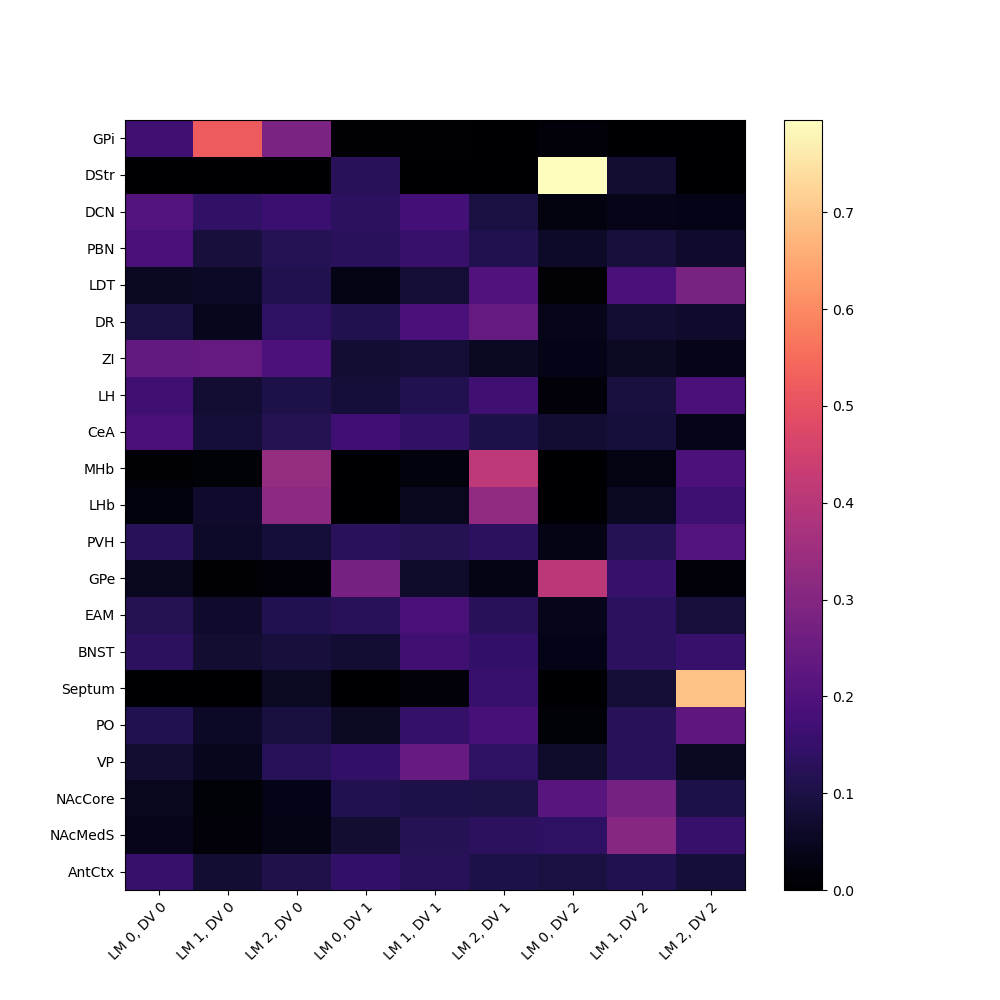

In [567]:
boxes_df = pandas.DataFrame(boxes_frac,index=regions_keys,columns=box_labels)

fig,ax =plt.subplots(figsize=(10,10))

plt.pcolor(boxes_df,cmap='magma')
plt.yticks(numpy.arange(0.5, len(boxes_df.index), 1), boxes_df.index)
plt.xticks(numpy.arange(0.5, len(boxes_df.columns), 1), boxes_df.columns)
# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")
plt.colorbar()
plt.show()
plt.savefig("../figures/vta-allen-boxes."+writebatch+".png")
plt.savefig("../figures/vta-allen-boxes."+writebatch+".svg")

In [184]:
i//3

2

In [185]:
i%3

2

In [568]:
umap_scaled_embedding=umap.UMAP(n_neighbors=25,min_dist=1,metric='euclidean').fit_transform(scaled_features)

In [569]:
clusterer=hdbscan.HDBSCAN(min_cluster_size=5)

clusterer.fit(umap_scaled_embedding)

color_palette = seaborn.color_palette('hls', (numpy.max(clusterer.labels_+1)))
cluster_colors = [color_palette[x] if x>= 0
                  else (0.5, 0.5, 0.5)
                  for x in clusterer.labels_]
cluster_member_colors = [seaborn.desaturate(x, p) for x, p in
                        zip(cluster_colors, clusterer.probabilities_)]
umap_cluster_colors_hex=['#%02x%02x%02x' %tuple(int(c*256) for c in l) for l in cluster_member_colors]

fig=go.Figure(data=go.Scatter(
    y=umap_scaled_embedding[:, 1],
    x=umap_scaled_embedding[:, 0],
    mode='markers',
    marker_color=umap_cluster_colors_hex,
    hoverinfo="text"
    ))

fig.update_layout(
    width=800,
    height=800,
    xaxis_title='UMAP 1D',
    yaxis_title='UMAP 2D',
    title={
        'text': "VTA Inputs - UMAP By Cell Type and Outputs",
        'x': 0.5
    },
    xaxis={
        'showline':True,
        'showgrid':False, 
        'ticks':'outside',
        'mirror':True,
        'zeroline':False
    },
    yaxis={
        'showline':True,
        'showgrid':False, 
        'ticks':'outside',
        'mirror':True,
        'zeroline':False
    }
)


In [245]:
numpy.min(scaled_features)

-1.0520223594801263

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning:

invalid value encountered in log



<IPython.core.display.Javascript object>


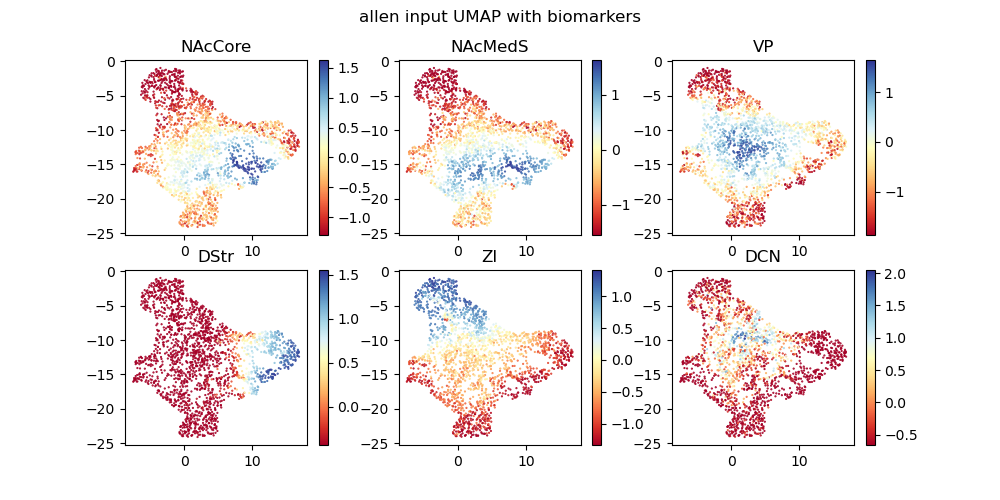

In [581]:
roi = numpy.array(['NAcCore','NAcMedS','VP','DStr','ZI','DCN'])
biomarker_df = numpy.log(scaled_features.copy()+1.1)

fig,ax = plt.subplots(2,3,figsize=(10,5))

cm = plt.cm.get_cmap('RdYlBu')
region_idx = [1,2,9,13,20,21]
idx = 0
for i in [0,1]:
    for j in [0,1,2]:
        r = numpy.argwhere(numpy.array(regions_keys)==roi[idx])
        sc = ax[i][j].scatter(umap_scaled_embedding[:,0],umap_scaled_embedding[:,1],c=biomarker_df[:,r],s=0.3,cmap=cm)
        plt.colorbar(sc,ax=ax[i][j])
        ax[i][j].set_title(roi[idx])
        idx=idx+1
fig.suptitle('allen input UMAP with biomarkers')
plt.savefig('../figures/allen-inputs-slice.umap.biomarkers.'+writebatch+'.png')
plt.savefig('../figures/allen-inputs-slice.umap.biomarkers.'+writebatch+'.svg')


In [574]:
umap_scaled_embedding.shape

(2058, 2)

In [579]:
biomarker_df[:,r]

array([], shape=(2058, 0, 1), dtype=float64)

<IPython.core.display.Javascript object>


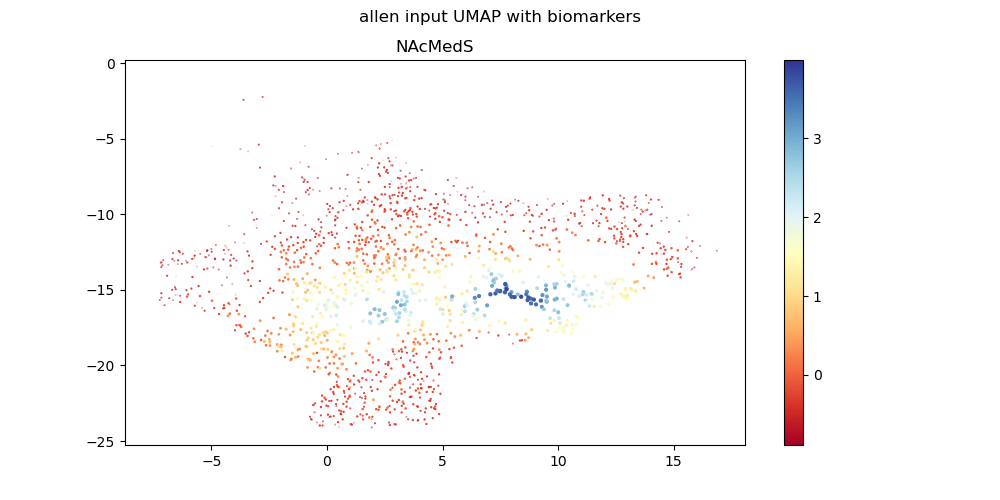

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\collections.py:922: RuntimeWarning:

invalid value encountered in sqrt



Text(0.5, 0.98, 'allen input UMAP with biomarkers')

In [582]:
roi = numpy.array(['NAcCore','NAcMedS','DStr','GPe','DCN','LH'])
biomarker_df = scaled_features.copy()

fig,ax = plt.subplots(1,1,figsize=(10,5))

cm = plt.cm.get_cmap('RdYlBu')

r = numpy.argwhere(numpy.array(regions_keys)==roi[1])
sc = ax.scatter(umap_scaled_embedding[:,0],umap_scaled_embedding[:,1],c=biomarker_df[:,r],s=(biomarker_df[:,r]+0.72),cmap=cm)
plt.colorbar(sc,ax=ax)
ax.set_title(roi[1])
fig.suptitle('allen input UMAP with biomarkers')
#plt.savefig('../figures/allen-inputs-slice.umap.biomarkers.'+writebatch+'.png')

In [215]:
numpy.percentile(biomarker_df[:,1],100)

9.951249723790095

In [217]:
numpy.max(biomarker_df[:,1])

9.951249723790095

In [232]:
numpy.percentile(biomarker_df[:,3],99)

-0.041800573799694485

In [234]:
numpy.min(biomarker_df[:,2])

-0.7242865607986446

In [220]:
r

array([[3]], dtype=int64)

In [701]:
box_coords.shape

(2058, 3)

<IPython.core.display.Javascript object>


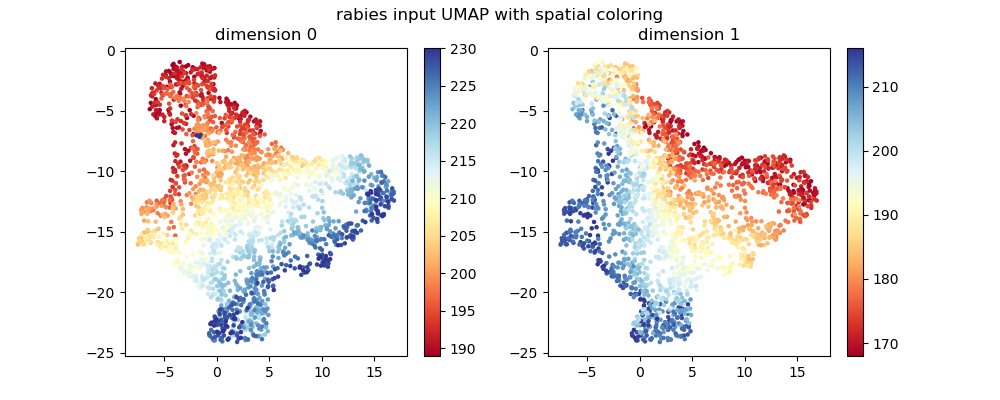

In [583]:
fig,ax = plt.subplots(1,2,figsize=(10,4))

cm = plt.cm.get_cmap('RdYlBu')
region_idx = [1,2,9,13,20,21]
for i in [0,1]:
    x = box_coords[:,i+1]
    sc = ax[i].scatter(umap_scaled_embedding[:,0],umap_scaled_embedding[:,1],c=x,s=5,cmap=cm)
    plt.colorbar(sc,ax=ax[i])
    ax[i].set_title('dimension ' + str(i))
fig.suptitle('rabies input UMAP with spatial coloring')
plt.savefig('../figures/allen-inputs.umap.spatial.'+writebatch+'.png')
plt.savefig('../figures/allen-inputs.umap.spatial.'+writebatch+'.svg')

<IPython.core.display.Javascript object>


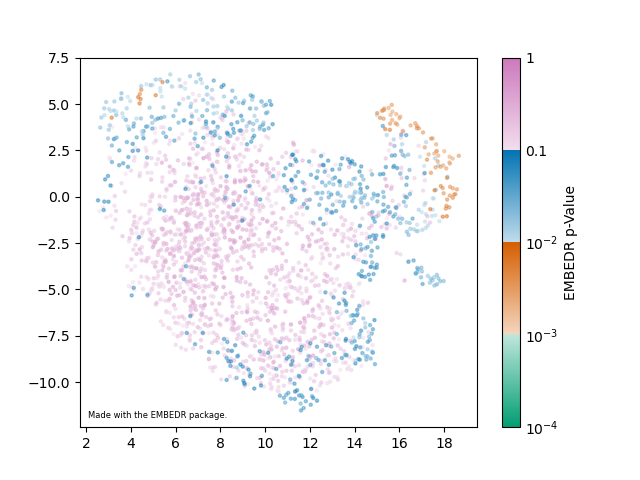



Initializing EMBEDR Object!



EMBEDR: Fitting 2058 x 21 data!


EMBEDR: Performing dimensionality reduction with UMAP!

Calculating EES using 1 embeddings and 1 nulls!


In [584]:
fig, ax = plt.subplots(1, 1)

umap_params = {
    'n_neighbors': 25,
    'min_dist': 1
}

embedr_obj = EMBEDR(random_state = 1,
                   verbose=1,
                   n_components=2,
                   dimred_alg="UMAP",
                   dimred_params=umap_params,
                   project_name='vta-allen-umap-pixels',
                   project_dir='embedr')

data_y = embedr_obj.fit_transform(scaled_features)

ax1 = embedr_obj.plot()
plt.show()

In [370]:
ax1 = embedr_obj.plot()
plt.show()

In [79]:
scaled_features_t=scaled_features.transpose()

z_scaled_features_t = zscore(scaled_features_t,axis=1)

allembedding=umap.UMAP(n_neighbors=4,min_dist=0.5,metric='euclidean').fit_transform(z_scaled_features_t)

<IPython.core.display.Javascript object>


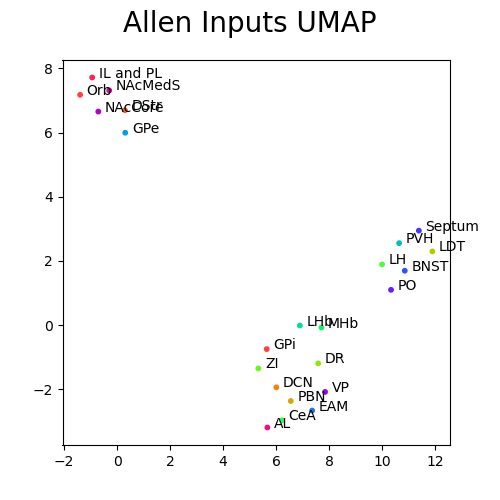

In [80]:
umapembedding_df = pandas.DataFrame(allembedding,columns=['umap-1d','umap-2d'])
umapembedding_df['regions'] = regions_keys

phi = numpy.linspace(0, 2*numpy.pi, len(regions_keys))
x = numpy.sin(phi)
y = numpy.cos(phi)
rgb_cycle = numpy.vstack((            # Three sinusoids
    .5*(1.+numpy.cos(phi          )), # scaled to [0,1]
    .5*(1.+numpy.cos(phi+2*numpy.pi/3)), # 120° phase shifted.
    .5*(1.+numpy.cos(phi-2*numpy.pi/3)))).T # Shape = (60,3)


fig, ax = plt.subplots(1, 1)
fig.set_figheight(5)
fig.set_figwidth(5)
fig.suptitle("Allen Inputs UMAP", fontsize=20)

ax.scatter(allembedding[:,0],allembedding[:,1],s=10, c=rgb_cycle)
#ax.set_xlim((0,6))

for i in range(len(regions_keys)):
    ax.annotate(regions_keys[i], (allembedding[i,0]+0.25, allembedding[i,1]))


fig.savefig('../figures/allen-inputs.region-umap.scaled.'+writebatch+'.png')
fig.savefig('../figures/allen-inputs.region-umap.scaled.'+writebatch+'.svg')

<IPython.core.display.Javascript object>


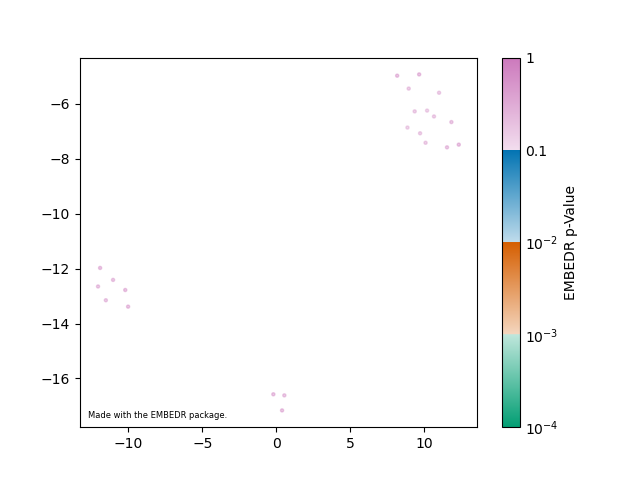



Initializing EMBEDR Object!



EMBEDR: Fitting 22 x 2058 data!


EMBEDR: Performing dimensionality reduction with UMAP!

Calculating EES using 1 embeddings and 1 nulls!


In [420]:

fig, ax = plt.subplots(1, 1)
umap_params = {
    'n_neighbors': 3,
    'min_dist': 0.5
}

embedr_obj = EMBEDR(random_state = 1,
                   verbose=1,
                   n_components=2,
                   dimred_alg="UMAP",
                   dimred_params=umap_params,
                   project_name='vta-allen-umap',
                   project_dir='embedr')

data_y = embedr_obj.fit_transform(z_scaled_features_t)

ax1 = embedr_obj.plot()
plt.show()

In [ ]:
vta_samples_slice = numpy.zeros((5,)+template_brain[xslice,:,:].shape)
#vta_pca_slice[:,:,:] = numpy.nan
for pca in range(0,5):
    print(pca)
    for i,coord in enumerate(box_coords):
        x,y,z = coord.astype(int)
        vta_pca_slice[pca,y,z]=scaled_features[i,pca]
        vta_pca_slice[pca,y,z]

In [257]:
pca_scaled_embedding.shape

(2058, 5)

In [258]:
scaled_features.shape

(2058, 22)

In [ ]:
fig,ax = plt.subplots(1,1,figsize=(5,5))
vta_pca_slice[0,:,:][vta_pca_slice[0,:,:] == 0.0] = numpy.nan
ax.imshow(masked_template_brain[xslice,(yu):(yd),(zl):(zr)], cmap='binary', aspect='equal', vmin=template.min(), vmax=template.max(),alpha=1,extent=ext)
fig.colorbar(ax.imshow(vta_pca_slice[0,(yu):(yd),(zl):(zr)], aspect='equal',alpha=1,extent=ext))
ax.set_xlabel('LM (mm)')
ax.set_ylabel('DV (mm)')
fig.suptitle('pc1')
plt.savefig("../figures/vta-allen-pc1."+writebatch+".png")

## use a 2d z slice from vta

In [114]:
zs = numpy.unique(coords[:,2])
zcount = numpy.zeros((len(zs),1))
for i,z in enumerate(zs):
    count = 0
    for coord in coords:
        if coord[2] == z:
            count = count + 1
    zcount[i]=count

In [115]:
zmax = numpy.argmax(zcount)
zslice = zs[zmax]
zcoords = coords[coords[:,2] == zslice]
zslice

203

In [116]:
zcoords.shape

(550, 3)

In [117]:
input_zslice_ar = numpy.zeros((len(coords),len(regions_keys)))
i=0
for coord in coords:
    if coord[0] != zslice:
        continue
    for j,rgn in enumerate(regions_keys):
        x,y,z=coord
        input_zslice_ar[i,j] = pds_dict[rgn][x+vta_x_min,y,z]
    i = i+1

In [118]:
input_zslice_ar.shape

(13677, 22)

<IPython.core.display.Javascript object>


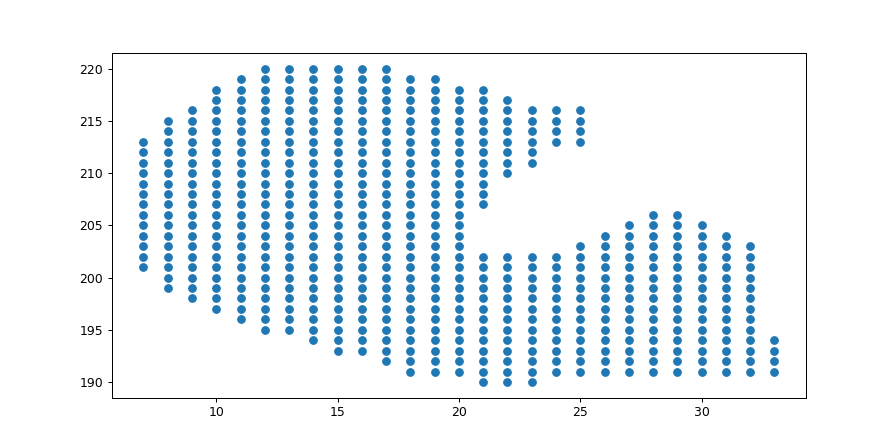

In [119]:
fig,ax = plt.subplots(1,1,figsize=(10,5))

sc = ax.scatter(zcoords[:,0],zcoords[:,1],)

In [120]:
xmin, ymin, zmin = numpy.min(zcoords,axis=0)
xmax, ymax, zmax = numpy.max(zcoords,axis=0)
xeps = 5; yeps = 5; zeps = 0;

In [121]:
xlen = xmax-xmin+2*xeps+1; ylen = ymax-ymin+2*yeps+1; zlen = zmax-zmin+2*zeps+1;

In [122]:
inputbox_ar = numpy.zeros((xlen*ylen*zlen,len(regions_keys)))
box_coords = numpy.zeros((xlen*ylen*zlen,3))

In [124]:
box_coords.shape

(1517, 3)

In [125]:
i=0
for x in range(xmin-xeps,xmax+xeps+1):
    for y in range(ymin-yeps,ymax+yeps+1):
        for z in range(zmin-zeps,zmax+zeps+1):
            box_coords[i,:]=numpy.array([x+vta_x_min,y,z],dtype=int)
            i=i+1

In [126]:
for i,coord in enumerate(box_coords):
    for j,rgn in enumerate(regions_keys):
        x,y,z=coord.astype(int)
        inputbox_ar[i,j] = pds_dict[rgn][x,y,z]

<IPython.core.display.Javascript object>


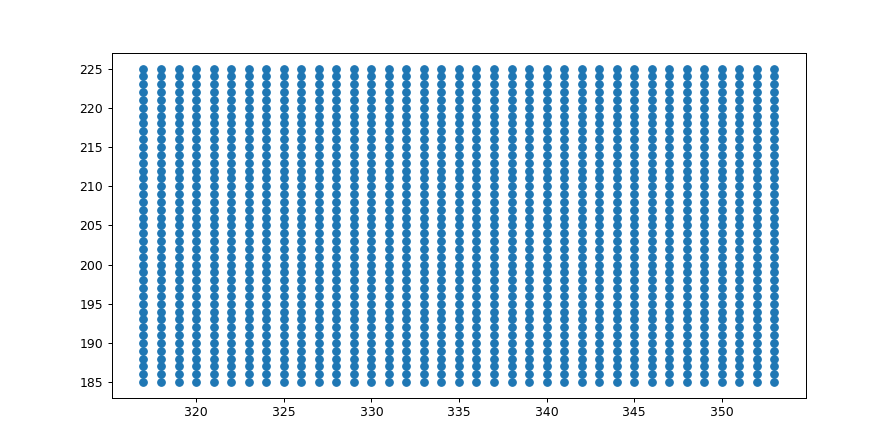

In [127]:
fig,ax = plt.subplots(1,1,figsize=(10,5))

sc = ax.scatter(box_coords[:,0],box_coords[:,1],)

In [130]:
scaled_features = preprocessing.scale(inputbox_ar)
pca_scaled = PCA(n_components=20)
pca_scaled.fit(scaled_features)
pca_scaled.explained_variance_ratio_

array([0.31419044, 0.12775688, 0.06791444, 0.05672059, 0.05086243,
       0.04669518, 0.04450376, 0.03862843, 0.03304945, 0.02989407,
       0.02860763, 0.02434455, 0.02152314, 0.02146085, 0.01786055,
       0.01569942, 0.0142011 , 0.01304253, 0.01162892, 0.01116347])

In [131]:
pca_scaled = PCA(n_components=5)
pca_scaled.fit(scaled_features)
pca_scaled_embedding = pca_scaled.transform(scaled_features)

<IPython.core.display.Javascript object>


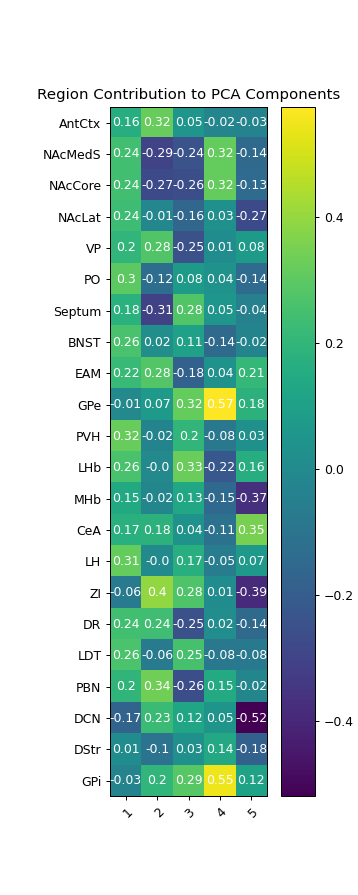

In [132]:
pca_components = pca_scaled.components_
pca_components = numpy.transpose(pca_components)


fig, ax = plt.subplots(figsize=(4,10))
im = ax.imshow(pca_components,cmap='viridis')

ax.set_xticks(numpy.arange(5))
ax.set_yticks(numpy.arange(len(regions_keys)))
# ... and label them with the respective list entries
ax.set_xticklabels([1,2,3,4,5])
ax.set_yticklabels(regions_keys)

# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

# Loop over data dimensions and create text annotations.
for i in range(len(regions_keys)):
    for j in range(5):
        text = ax.text(j, i, pca_components[i, j].round(decimals=2),
                       ha="center", va="center", color="w")

ax.set_title("Region Contribution to PCA Components")
#fig.tight_layout()

# Create colorbar
cbar = ax.figure.colorbar(im, ax=ax)
plt.savefig('../figures/allen-inputs.pca-zbox.components.png',facecolor='white', transparent=False)
plt.show()

In [133]:
numpy.savetxt('../data/vtazboxcoords.csv', box_coords, delimiter=",")
numpy.savetxt('../data/allen-inputs.pca-zbox.csv', pca_scaled_embedding, delimiter=",")
numpy.savetxt('../data/vtazcoords.csv', xcoords, delimiter=",")